# Thesis visuals: the data and the example voxels
**Detection Transformer for Microstructure Quantification from T1-T2 Correlation MRI**

This notebook is the figure workbench for the thesis. It runs no new experiment: every
panel is recomputed from the generated datasets, the stored run results and the saved
checkpoints.

Part 1 covers the data: the fixed 64-point acquisition protocol, where compartments sit
in the T1-T2 plane, how the sampler's marginals depart from log-uniform, the weight and
SNR draws, and a multi-compartment signal before and after noise.

Part 2 shows example test voxels, the same voxels under two models. One row per model,
one column per example, so a difference between the rows is a difference between the
models only.

Part 3 collects the result tables and figures of the thesis, recomputed from `results/`
and read from `figures/`.

Marker convention in Part 2: a ground-truth compartment is a filled blue disc, a
prediction is an open ring, and a thin connector runs from each ground truth to the
prediction the ND rule assigned to it. Marker area is proportional to weight for both.
An earlier version drew predictions as crosses on top of the ground-truth circles, which
hid the ground truth whenever the model was right; the connector shows the error as a
displacement and stays readable when the two markers almost coincide.

In [1]:
import json, os, sys
from pathlib import Path

# The notebook expects the repository root as the working directory; tolerate being
# started from notebooks/ instead.
if not Path("t1t2").is_dir() and Path("../t1t2").is_dir():
    os.chdir("..")
ROOT = Path.cwd()
sys.path.insert(0, ".")
sys.path.insert(0, "datagen")

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle

# ------------------------------------------------------------------ figure style
# Font sizes by role: BASE for titles and axis labels, SMALL for legend and
# annotations, TINY for ticks.
BASE, SMALL, TINY = 9, 8, 7
mpl.rcParams.update({
    "figure.dpi": 120, "savefig.dpi": 300, "savefig.bbox": "tight",
    "font.size": BASE, "axes.titlesize": BASE, "axes.labelsize": BASE,
    "legend.fontsize": SMALL, "xtick.labelsize": TINY, "ytick.labelsize": TINY,
    "axes.titlelocation": "left", "axes.titlepad": 6,
    "axes.spines.top": False, "axes.spines.right": False,
    "xtick.direction": "out", "ytick.direction": "out",
    "legend.frameon": False, "axes.grid": False,
    "figure.facecolor": "white", "axes.facecolor": "white",
})

# ------------------------------------------------------------------ palette
# One colour per entity, used in every panel. Blue / purple / orange stay
# distinguishable under deuteranopia; red against green is not used.
C_GT       = "#1f4e79"   # ground truth
C_GT_FILL  = "#4a7fb5"
C_MATCH    = "#7b3294"   # prediction the ND rule assigned to a ground truth
C_FP       = "#d55e00"   # declared prediction assigned to nothing
C_LINK     = "#8c8c8c"   # ground-truth -> prediction connector
C_BOX      = "#bdbdbd"   # tau acceptance box
C_REF      = "#4a7fb5"   # reference model, in curves
C_ARM      = "#c1670c"   # the arm under test, in curves
C_NOISE    = "#b0b0b0"

FIGDIR = Path("figures")
FIGDIR.mkdir(parents=True, exist_ok=True)


def linear_log_ticks(ax, which="both"):
    """Log-axis ticks in plain milliseconds (120, 300, 1k) instead of 3 x 10^2.

    A zoomed panel often spans less than a decade, and the default log formatter then
    labels the minor ticks in scientific notation.
    """
    def fmt(v, _):
        """Shorten large tick values using k for thousands."""
        if v >= 1000:
            return f"{v/1000:.1f}".rstrip("0").rstrip(".") + "k"
        return f"{v:g}"
    pairs = []
    if which in ("both", "x"):
        pairs.append((ax.xaxis, ax.get_xlim()))
    if which in ("both", "y"):
        pairs.append((ax.yaxis, ax.get_ylim()))
    for axis, (lo, hi) in pairs:
        def locs_for(subs, n):
            """Find log-scale ticks within the visible axis limits."""
            L = mticker.LogLocator(subs=subs, numticks=n)
            L.set_axis(axis)
            return [t for t in L.tick_values(lo, hi) if lo <= t <= hi]
        major = locs_for((1.0, 2.0, 5.0), 12)
        if len(major) < 2:                 # a sub-decade span can leave <2 major ticks
            major = locs_for("all", 12)
        minor = [t for t in locs_for((1.5, 3.0, 4.0, 7.0), 24) if t not in set(major)]
        # FixedLocator, not LogLocator: LogLocator keeps Text objects for tick
        # positions outside the view, and their off-canvas window extents break the
        # extent measurements in layout_with_furniture.
        axis.set_major_locator(mticker.FixedLocator(major))
        axis.set_minor_locator(mticker.FixedLocator(minor))
        axis.set_major_formatter(mticker.FuncFormatter(fmt))
        axis.set_minor_formatter(mticker.NullFormatter())


def layout_with_furniture(fig, handles=None, ncol=3, title=None):
    """tight_layout, then a figure legend below everything and a title above it.

    tight_layout ignores figure-level artists, and reserving a guessed fraction of the
    figure height for them drifts when the panel count or a font size changes. So the
    axes are laid out first, the lowest and highest drawn text are measured, and the
    legend and title are anchored outside those extents. They may sit beyond the
    nominal canvas; `bbox_inches="tight"` grows the written PNG to include them.
    """
    fig.tight_layout()
    fig.canvas.draw()
    r = fig.canvas.get_renderer()
    H = fig.get_figheight() * fig.dpi
    pad = 0.09 * fig.dpi

    def extent_band():
        """Lowest and highest drawn pixel over text and axes boxes.

        Text anchored outside its own axes is skipped: matplotlib keeps Text objects
        for off-view tick positions, and their far-off-canvas extents would push the
        legend hundreds of pixels below the figure.
        """
        boxes = [ax.get_window_extent(r) for ax in fig.axes]
        for t in fig.findobj(mpl.text.Text):
            if not (t.get_text().strip() and t.get_visible()):
                continue
            b = t.get_window_extent(r)
            ax = getattr(t, "axes", None)
            if ax is not None:
                ab = ax.get_window_extent(r).expanded(1.6, 1.6)
                if not (ab.y0 <= b.y0 and b.y1 <= ab.y1):
                    continue
            boxes.append(b)
        return min(b.y0 for b in boxes), max(b.y1 for b in boxes)

    lo, hi = extent_band()
    leg = sup = None
    if handles:
        leg = fig.legend(handles=handles, loc="upper center", ncol=ncol, fontsize=TINY,
                         bbox_to_anchor=(0.5, (lo - pad) / H))
    if title:
        sup = fig.text(0.008, (hi + pad) / H, title, fontsize=BASE, ha="left",
                       va="bottom")
    return leg, sup


def text_overlaps(fig):
    """Visible text boxes that collide with each other.

    A geometric check only: it catches two labels landing on top of each other and
    nothing else (low contrast, a leader crossing a curve, or a label on a data marker
    still need an eye). Adjacent tick labels on the same axis are exempt. No clipping
    check, because the panels are written with `bbox_inches="tight"`, which expands
    the canvas to include every artist.
    """
    fig.canvas.draw()
    r = fig.canvas.get_renderer()
    texts = [(t, t.get_window_extent(r)) for t in fig.findobj(mpl.text.Text)
             if t.get_text().strip() and t.get_visible()]
    ticks = set()
    for ax in fig.axes:
        ticks |= set(ax.get_xticklabels(which="both") + ax.get_yticklabels(which="both"))
    bad = []
    for i, (a, ba) in enumerate(texts):
        for b, bb in texts[i + 1:]:
            if a in ticks and b in ticks:
                continue
            if ba.overlaps(bb):
                bad.append(f"'{a.get_text()[:24]}' x '{b.get_text()[:24]}'")
    return bad


def save(fig, name):
    """Write a panel to FIGDIR/<name>.png and report the path."""
    p = FIGDIR / f"{name}.png"
    p.parent.mkdir(parents=True, exist_ok=True)   # `name` may contain a subdirectory
    fig.savefig(p)
    bad = text_overlaps(fig)
    note = (f"  [{len(bad)} text overlap(s): " + "; ".join(bad[:3]) + "]") if bad else ""
    print(f"saved {p}{note}")
    return p


print("cwd is the repository root:", (ROOT / "t1t2").is_dir())

cwd is the repository root: True


## Configuration

Two settings decide what Part 2 shows. `REF_ARM` is the reference the arm is measured
against, normally the reproduction control (the arm with no parameter changed). `ARM` is
the model under test. Both must have been evaluated on the same test set; the paired
panels only compare anything if the voxels are identical.

In [2]:
REF_ARM = "baseline_v2_reproduction"   # control: byte-identical rerun of the frozen baseline
ARM     = "loss_uniform"               # the model under test: the thesis's final model
TAU     = 0.07                         # ND acceptance threshold, fraction of each log span

DATASET  = "data/t1_3500_t2_500_100k"  # the dataset both arms were trained and tested on
CACHE    = Path("notebooks/.cache_visuals"); CACHE.mkdir(parents=True, exist_ok=True)

LABEL = {REF_ARM: "reference", ARM: ARM}   # short row labels for the figures
L_REF, L_ARM = LABEL[REF_ARM], LABEL[ARM]  # use these in titles, never the raw names

# Both arms must point at the same test files, otherwise voxel i is a different
# voxel in the two rows of the paired panels.
def _test_paths(arm):
    """Read the test dataset paths for an experiment."""
    p = Path(f"configs/{arm}.yaml")
    if not p.exists():
        p = Path(f"results/{arm}/config.yaml")
    import yaml
    return tuple(yaml.safe_load(p.read_text())["data"]["test_path"])

assert _test_paths(REF_ARM) == _test_paths(ARM), (
    f"{REF_ARM} and {ARM} were tested on different files; the paired panels would be "
    "meaningless. Pick two arms that share a test set."
)
print(f"reference : {REF_ARM}")
print(f"arm       : {ARM}")
print(f"test set  : {_test_paths(ARM)}")

reference : baseline_v2_reproduction
arm       : loss_uniform
test set  : ('data/t1_3500_t2_500_100k/n1/test.parquet', 'data/t1_3500_t2_500_100k/n2/test.parquet', 'data/t1_3500_t2_500_100k/n3/test.parquet')


---
# Part 1: the data

Everything the network sees comes from a simulator, so the data figures are the
specification of the problem. Four things are shown before any result: the acquisition
protocol, where compartments sit in the T1-T2 plane, how large the compartments are
(weight) relative to the noise, and what a signal looks like.

In [3]:
from voxel_simulator.protocol import load_protocol
from voxel_simulator.physics import simulate_clean_signal

proto = load_protocol()
print(proto.summary())

# Load the three per-compartment-count test files as one frame, tagged by n_comp.
parts = []
for n in (1, 2, 3):
    df = pd.read_parquet(f"{DATASET}/n{n}/test.parquet")
    parts.append(df)
TEST = pd.concat(parts, ignore_index=True)

# Long form: one row per ground-truth compartment.
rows = []
for k in range(1, 5):
    sub = TEST[["voxel_id", "n_comp", "snr", "sigma", f"T1_{k}", f"T2_{k}", f"w_{k}"]].dropna()
    sub = sub.rename(columns={f"T1_{k}": "T1", f"T2_{k}": "T2", f"w_{k}": "w"})
    sub["slot"] = k
    rows.append(sub)
GT = pd.concat(rows, ignore_index=True)

print(f"test voxels        : {len(TEST):,}  ({TEST.n_comp.value_counts().sort_index().to_dict()})")
print(f"GT compartments    : {len(GT):,}")
print(f"T1 range (ms)      : {GT.T1.min():.1f} to {GT.T1.max():.1f}")
print(f"T2 range (ms)      : {GT.T2.min():.1f} to {GT.T2.max():.1f}")
print(f"weight range       : {GT.w.min():.3f} to {GT.w.max():.3f}")
print(f"SNR range          : {TEST.snr.min():.1f} to {TEST.snr.max():.1f}")

Protocol: 64 points, 8 unique TI [50.0, 2000.0] ms, 8 unique TE [4.5, 150.0] ms, TR=20000 ms


test voxels        : 9,999  ({1: 3333, 2: 3333, 3: 3333})
GT compartments    : 19,998
T1 range (ms)      : 50.0 to 3499.8
T2 range (ms)      : 5.0 to 499.6
weight range       : 0.050 to 1.000
SNR range          : 30.0 to 150.0


## 1.1 The acquisition protocol

The 64 measurements form a fixed 8 TI x 8 TE grid, log-spaced in TI, acquired in a
scrambled order. The network sees that order as a fixed permutation of its 64 input
channels.

Panels (b) and (c) turn the sampling pattern into a statement about the T1-T2 plane: at
each point, one relaxation time is shifted by 10% and the distance the peak-normalised
64-vector moves is measured. This is a property of the protocol alone. No estimator,
noise model or error bound enters it. T1 leaves a clear trace everywhere it is
sampled. T2 does not: above TE_max = 150 ms the longest echo has barely decayed, so two
compartments that differ in T2 produce nearly the same 64 numbers. A free-water or
CSF-like pool is therefore close to unidentifiable by the protocol itself, which is why
the long-T2 range is broken out separately downstream.

saved figures/01_protocol.png


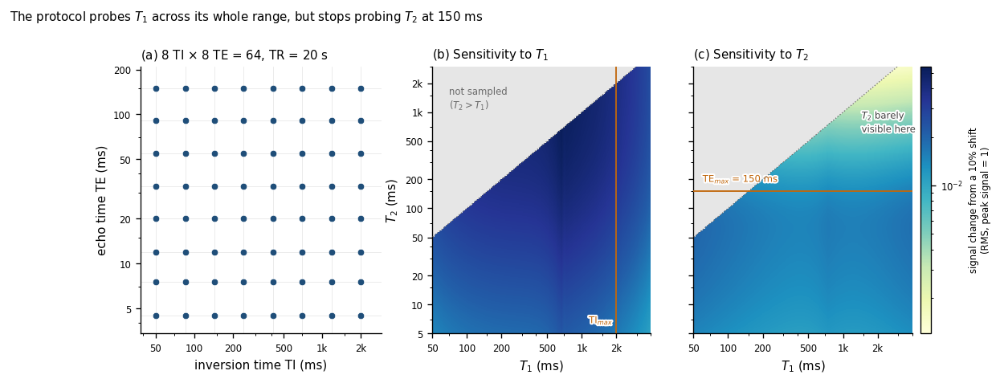

T2 =   150 ms -> exp(-TE_max/T2) = 0.368
T2 =   300 ms -> exp(-TE_max/T2) = 0.607
T2 =   500 ms -> exp(-TE_max/T2) = 0.741
T2 =  1000 ms -> exp(-TE_max/T2) = 0.861


In [4]:
STEP, NG = 1.10, 300

def _unit_signal(T1, T2):
    """Peak-normalised 64-point signal of ONE compartment; broadcasts over a grid."""
    T1 = np.asarray(T1)[..., None]; T2 = np.asarray(T2)[..., None]
    s = (1 - 2*np.exp(-proto.ti/T1) + np.exp(-proto.tr/T1)) * np.exp(-proto.te/T2)
    return s / np.max(np.abs(s), axis=-1, keepdims=True)

t1g = np.logspace(np.log10(50), np.log10(4000), NG)
t2g = np.logspace(np.log10(5),  np.log10(3000), NG)
A, B = np.meshgrid(t1g, t2g)
s0 = _unit_signal(A, B)
d1 = np.sqrt(np.mean((_unit_signal(A*STEP, B) - s0)**2, axis=-1))
d2 = np.sqrt(np.mean((_unit_signal(A, B*STEP) - s0)**2, axis=-1))
infeasible = B >= A                       # the generator draws T1 > T2
d1 = np.where(infeasible, np.nan, d1)
d2 = np.where(infeasible, np.nan, d2)

HALO = [pe.Stroke(linewidth=2.4, foreground="white"), pe.Normal()]
fig, axes = plt.subplots(1, 3, figsize=(11.6, 3.6),
                         gridspec_kw={"width_ratios": [0.92, 1, 1]})

# --- (a) where the protocol samples
ax = axes[0]
for v in np.unique(proto.ti): ax.axvline(v, color="0.91", lw=0.5, zorder=1)
for v in np.unique(proto.te): ax.axhline(v, color="0.91", lw=0.5, zorder=1)
ax.scatter(proto.ti, proto.te, s=27, color=C_GT, edgecolors="white", linewidths=0.5, zorder=3)
ax.set_xscale("log"); ax.set_yscale("log")
ax.set_xlim(38, 2900); ax.set_ylim(3.4, 210)
ax.set_xlabel("inversion time TI (ms)"); ax.set_ylabel("echo time TE (ms)")
# raw f-string: in a plain string \t would be a tab and the title would read "imes"
ax.set_title(rf"(a) {len(np.unique(proto.ti))} TI $\times$ {len(np.unique(proto.te))} TE = "
             rf"{proto.n_points}, TR = {proto.tr/1000:.0f} s")
linear_log_ticks(ax)

# --- (b),(c) how strongly each parameter shows up in those 64 numbers
LO, HI = 1.2e-3, 5.5e-2
norm = mpl.colors.LogNorm(LO, HI)
for ax, d, sym, panel in ((axes[1], d1, "T_1", "b"), (axes[2], d2, "T_2", "c")):
    ax.set_facecolor("0.90")
    im = ax.pcolormesh(t1g, t2g, np.clip(d, LO, HI), norm=norm, cmap="YlGnBu", shading="auto")
    ax.plot([5, 3000], [5, 3000], color="0.45", lw=0.8, ls=":", zorder=5)
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_xlim(50, 4000); ax.set_ylim(5, 3000)
    ax.set_xlabel("$T_1$ (ms)")
    ax.set_title(f"({panel}) Sensitivity to ${sym}$")
    linear_log_ticks(ax)
axes[1].set_ylabel("$T_2$ (ms)")
axes[2].tick_params(labelleft=False)

axes[1].axvline(proto.ti.max(), color=C_ARM, lw=1.1, zorder=6)
axes[1].annotate("TI$_{max}$", xy=(proto.ti.max()*0.94, 6.4), fontsize=TINY, color=C_ARM,
                 ha="right", path_effects=HALO)
axes[1].annotate("not sampled\n($T_2 > T_1$)", xy=(70, 1100), fontsize=TINY,
                 color="0.42", zorder=7)
axes[2].axhline(proto.te.max(), color=C_ARM, lw=1.1, zorder=6)
axes[2].annotate(f"TE$_{{max}}$ = {proto.te.max():.0f} ms", xy=(60, proto.te.max()*1.16),
                 fontsize=TINY, color=C_ARM, va="bottom", path_effects=HALO)
axes[2].annotate("$T_2$ barely\nvisible here", xy=(1450, 620), fontsize=TINY,
                 color="0.25", path_effects=HALO, zorder=7)

cb = fig.colorbar(im, ax=axes[1:], pad=0.015, aspect=26)
cb.set_label("signal change from a 10% shift\n(RMS, peak signal = 1)", fontsize=TINY)
cb.ax.tick_params(labelsize=TINY)
fig.suptitle("The protocol probes $T_1$ across its whole range, but stops probing $T_2$ at 150 ms",
             fontsize=BASE, x=0.008, y=1.045, ha="left")
save(fig, "01_protocol")
plt.show()

# the numbers behind panel (c): how flat the T2 term is beyond TE_max
for t2 in (150, 300, 500, 1000):
    print(f"T2 = {t2:5d} ms -> exp(-TE_max/T2) = {np.exp(-proto.te.max()/t2):.3f}")

## 1.2 Where compartments live

The sampler draws log T1 and log T2 independently and log-uniformly and keeps the pair
only if T2 < T1 (rejection sampling). The accepted pairs are therefore uniform over the
feasible region below the diagonal: a triangle joined to a rectangle, because above
T1 ≈ 500 ms the whole T2 range is admissible and below it the diagonal cuts the T2 range
short.

Coverage is a confounder for every error-versus-T1 plot in the results: a large error at
short T1 could mean that short T1 is hard, or only that the model saw fewer such
compartments. The two marginal panels separate those two readings.

saved figures/02_coverage.png


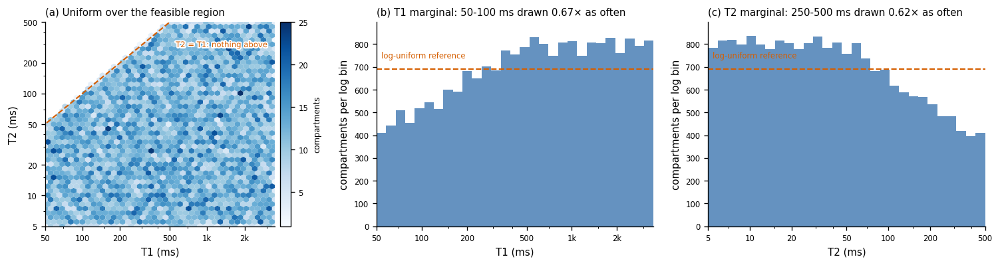

T1: density relative to log-uniform, by log-quartile: 0.71×  0.98×  1.15×  1.16×
T2: density relative to log-uniform, by log-quartile: 1.17×  1.16×  0.98×  0.69×


In [5]:
lim1, lim2 = (50, 3500), (5, 500)

fig, axes = plt.subplots(1, 3, figsize=(12.6, 3.4))

# --- (a) joint coverage
ax = axes[0]
hb = ax.hexbin(GT.T1, GT.T2, xscale="log", yscale="log", gridsize=40,
               cmap="Blues", mincnt=1, linewidths=0,
               extent=(*np.log10(lim1), *np.log10(lim2)))
diag = np.logspace(np.log10(lim2[0]), np.log10(lim2[1]), 100)
ax.plot(diag, diag, color=C_FP, lw=1.3, ls="--", zorder=4)
ax.annotate("T2 = T1: nothing above", xy=(560, 300), fontsize=TINY, color=C_FP,
            ha="left", va="center",
            path_effects=[pe.Stroke(linewidth=2.4, foreground="white"), pe.Normal()])
ax.set_xlim(*lim1); ax.set_ylim(*lim2)
ax.set_xlabel("T1 (ms)"); ax.set_ylabel("T2 (ms)")
ax.set_title("(a) Uniform over the feasible region")
linear_log_ticks(ax)
cb = fig.colorbar(hb, ax=ax, pad=0.02); cb.set_label("compartments", fontsize=TINY)
cb.ax.tick_params(labelsize=TINY)

# --- (b), (c) the two marginals against their log-uniform reference.
# Depletion factor: density in the band named in the title relative to a log-uniform
# draw. Measured here, not hardcoded, so the title and the text cannot disagree.
def _depletion(v, lim, band):
    """Compare observed band coverage with a log-uniform reference."""
    span = np.log(lim[1]) - np.log(lim[0])
    share = (np.log(band[1]) - np.log(band[0])) / span
    return ((v >= band[0]) & (v < band[1])).mean() / share

for ax, v, lim, name, letter, band, word in (
        (axes[1], GT.T1, lim1, "T1", "b", (50, 100),  "short T1"),
        (axes[2], GT.T2, lim2, "T2", "c", (250, 500), "long T2")):
    note = (f"{band[0]}-{band[1]} ms drawn "
            f"{_depletion(v, lim, band):.2f}\u00d7 as often")
    edges = np.logspace(np.log10(lim[0]), np.log10(lim[1]), 30)
    ax.hist(v, bins=edges, color=C_GT_FILL, alpha=0.85, lw=0)
    ref = len(v) / (len(edges) - 1)
    ax.axhline(ref, color=C_FP, ls="--", lw=1.3)
    ax.annotate("log-uniform reference", xy=(lim[0], ref * 1.06), xytext=(4, 0),
                textcoords="offset points", ha="left", va="bottom",
                fontsize=TINY, color=C_FP)
    ax.set_xscale("log"); ax.set_xlim(*lim); ax.set_ylim(0, ref * 1.30)
    ax.set_xlabel(f"{name} (ms)")
    ax.set_ylabel("compartments per log bin")
    ax.set_title(f"({letter}) {name} marginal: {note}")
    linear_log_ticks(ax, which="x")

fig.tight_layout()
save(fig, "02_coverage")
plt.show()

# density relative to log-uniform by log-quartile, for the caption
for name, v, (lo, hi) in [("T1", GT.T1, lim1), ("T2", GT.T2, lim2)]:
    u = (np.log(v) - np.log(lo)) / (np.log(hi) - np.log(lo))
    dec = np.histogram(u, bins=4, range=(0, 1))[0] / len(v) * 4
    print(f"{name}: density relative to log-uniform, by log-quartile: "
          + "  ".join(f"{x:.2f}×" for x in dec))

## 1.3 Compartment weights and the noise level

Weights come from a symmetric Dirichlet, rescaled so that every compartment carries at
least `min_weight = 0.05` of the signal, and sum to one. Weight decides whether a
compartment is detectable at all: a compartment holding 6 % of the signal in a voxel
measured at SNR 30 is close to the noise floor. The weight-resolved curves in the results
are where the model's failures should be read.

saved figures/03_weights_snr.png


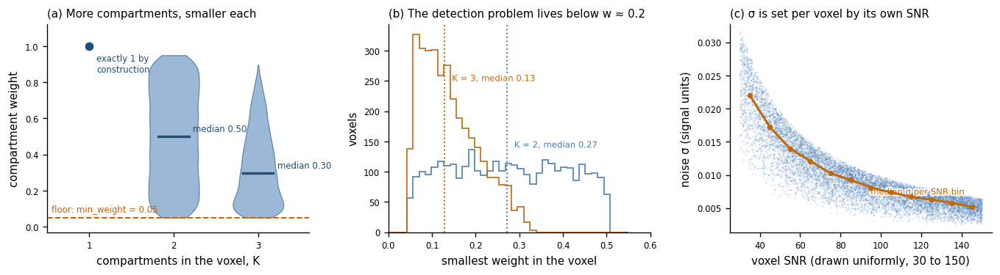

K=2: smallest weight: median 0.271, 10.5% of voxels below 0.10
K=3: smallest weight: median 0.129, 32.9% of voxels below 0.10
noise sigma: 0.0025 to 0.0315 (median 0.0084)


In [6]:
fig, axes = plt.subplots(1, 3, figsize=(11.4, 3.2))

# --- (a) weight distribution per compartment count.
# K = 1 is w = 1 by construction, so it gets a marker, not a violin (a violin of a
# degenerate distribution would read as a measured spread).
ax = axes[0]
for K in (1, 2, 3):
    w = GT.w[GT.n_comp == K].to_numpy()
    if np.ptp(w) < 1e-9:
        ax.plot([K], [w[0]], marker="o", ms=6, color=C_GT, zorder=5)
        ax.annotate("exactly 1 by\nconstruction", xy=(K, w[0]), xytext=(6, -6),
                    textcoords="offset points", fontsize=TINY, color=C_GT, va="top")
    else:
        pv = ax.violinplot([w], positions=[K], widths=0.6, showextrema=False)
        for b in pv["bodies"]:
            b.set_facecolor(C_GT_FILL); b.set_alpha(0.55)
            b.set_edgecolor(C_GT); b.set_lw(0.8)
        ax.plot([K - 0.18, K + 0.18], [np.median(w)] * 2, color=C_GT, lw=2.0, zorder=5)
        ax.annotate(f"median {np.median(w):.2f}", xy=(K + 0.2, np.median(w)),
                    xytext=(2, 4), textcoords="offset points", fontsize=TINY, color=C_GT)
ax.axhline(0.05, color=C_FP, ls="--", lw=1.2)
ax.annotate("floor: min_weight = 0.05", xy=(0.55, 0.07), ha="left", va="bottom",
            fontsize=TINY, color=C_FP)
ax.set_xticks([1, 2, 3]); ax.set_xlim(0.5, 3.6); ax.set_ylim(-0.03, 1.12)
ax.set_xlabel("compartments in the voxel, K")
ax.set_ylabel("compartment weight")
ax.set_title("(a) More compartments, smaller each")

# --- (b) the smallest compartment in each voxel: the hard case
ax = axes[1]
for K, c, fy in zip((2, 3), (C_REF, C_ARM), (0.42, 0.74)):
    mins = GT[GT.n_comp == K].groupby("voxel_id").w.min()
    ax.hist(mins, bins=np.linspace(0, 0.55, 40), histtype="step", lw=1.7, color=c)
    med = mins.median()
    ax.axvline(med, color=c, ls=":", lw=1.2)
    ax.annotate(f"K = {K}, median {med:.2f}", xy=(med, fy),
                xycoords=("data", "axes fraction"), xytext=(6, 0),
                textcoords="offset points", ha="left", va="center",
                fontsize=TINY, color=c,
                path_effects=[pe.Stroke(linewidth=2.4, foreground="white"), pe.Normal()])
ax.set_xlim(0, 0.60)
ax.set_xlabel("smallest weight in the voxel")
ax.set_ylabel("voxels")
ax.set_title("(b) The detection problem lives below w ≈ 0.2")

# --- (c) the noise: SNR is drawn uniformly, sigma is what the voxel actually gets
ax = axes[2]
ax.scatter(TEST.snr, TEST.sigma, s=1.5, color=C_GT_FILL, alpha=0.25, lw=0, zorder=2)
q = TEST.groupby(pd.cut(TEST.snr, np.linspace(30, 150, 13)), observed=True).sigma.median()
mids = np.array([iv.mid for iv in q.index])
ax.plot(mids, q.to_numpy(), color=C_ARM, lw=1.8, marker="o", ms=3.5, zorder=4)
ax.annotate("median σ per SNR bin", xy=(mids[-1], q.to_numpy()[-1]), xytext=(-6, 10),
            textcoords="offset points", ha="right", fontsize=TINY, color=C_ARM,
            path_effects=[pe.Stroke(linewidth=2.4, foreground="white"), pe.Normal()])
ax.set_xlabel("voxel SNR (drawn uniformly, 30 to 150)")
ax.set_ylabel("noise σ (signal units)")
ax.set_title("(c) σ is set per voxel by its own SNR")
ax.margins(0.04)

fig.tight_layout()
save(fig, "03_weights_snr")
plt.show()

for K in (2, 3):
    m = GT[GT.n_comp == K].groupby("voxel_id").w.min()
    print(f"K={K}: smallest weight: median {m.median():.3f}, "
          f"{(m < 0.10).mean():.1%} of voxels below 0.10")
print(f"noise sigma: {TEST.sigma.min():.4f} to {TEST.sigma.max():.4f} "
      f"(median {TEST.sigma.median():.4f})")

## 1.4 What one voxel's signal looks like

The forward model is a weighted sum of inversion-recovery / spin-echo terms,

$$S_p = \sum_c w_c \left(1 - 2e^{-\mathrm{TI}_p/T1_c} + e^{-\mathrm{TR}/T1_c}\right)
        e^{-\mathrm{TE}_p/T2_c}$$

sampled at the 64 protocol points and corrupted by additive Gaussian noise at the voxel's
own SNR. Plotting against acquisition index would give a sawtooth, because the
acquisition order is scrambled. Plotting against TE with one curve per TI shows the
structure: each curve is a T2 decay, and the family of curves is the T1 recovery.

The examples are taken from the low-SNR end of the distribution (SNR ≤ 45), so the noise
is visible at the scale of the panel. This is the inverse problem the network is given:
recover K, and 3K parameters, from these 64 numbers.

saved figures/04_signals.png


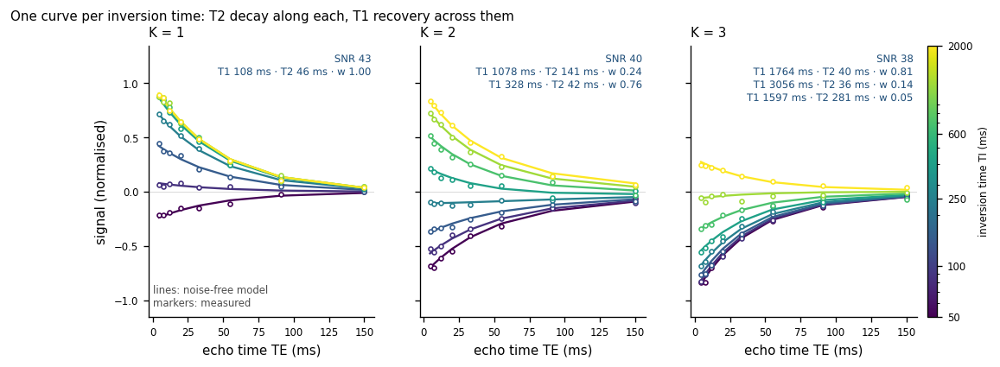

In [7]:
# One example per compartment count, chosen deterministically: the first test voxel
# with SNR <= 45 whose smallest compartment is below the median for that count.
# SNR <= 45 is a third of the training range; at high SNR the noise is invisible at
# print size.
ex_rows = {}
for K in (1, 2, 3):
    sub = TEST[TEST.n_comp == K].reset_index(drop=True)
    wcols = [f"w_{k}" for k in range(1, K + 1)]
    minw = sub[wcols].min(axis=1).to_numpy()
    ok = (sub.snr.to_numpy() <= 45) & (minw <= np.median(minw))
    ex_rows[K] = sub.iloc[int(np.argmax(ok))]

TI_U = np.unique(proto.ti)
cmap = plt.get_cmap("viridis")

fig, axes = plt.subplots(1, 3, figsize=(11.4, 3.4), sharey=True)
for j, K in enumerate((1, 2, 3)):
    r = ex_rows[K]
    ax = axes[j]
    comp = [(r[f"T1_{k}"], r[f"T2_{k}"], r[f"w_{k}"]) for k in range(1, K + 1)]
    clean = simulate_clean_signal(proto, np.array([c[0] for c in comp]),
                                  np.array([c[1] for c in comp]),
                                  np.array([c[2] for c in comp]))
    noisy = np.array([r[f"S_{i+1}"] for i in range(proto.n_points)])
    for u, ti in enumerate(TI_U):
        m = proto.ti == ti
        o = np.argsort(proto.te[m])
        col = cmap(u / (len(TI_U) - 1))
        ax.plot(proto.te[m][o], clean[m][o], color=col, lw=1.4, zorder=3)
        ax.plot(proto.te[m][o], noisy[m][o], color=col, lw=0, marker="o", ms=3.0,
                mfc="white", mew=1.0, zorder=4)
    ax.axhline(0, color="0.85", lw=0.6, zorder=1)
    txt = "\n".join(f"T1 {c[0]:.0f} ms · T2 {c[1]:.0f} ms · w {c[2]:.2f}" for c in comp)
    ax.annotate(f"SNR {r.snr:.0f}\n{txt}", xy=(0.985, 0.97), xycoords="axes fraction",
                ha="right", va="top", fontsize=TINY, color=C_GT,
                path_effects=[pe.Stroke(linewidth=2.4, foreground="white"), pe.Normal()])
    ax.set_xlabel("echo time TE (ms)")
    ax.set_title(f"K = {K}")
    if j == 0:
        ax.set_ylabel("signal (normalised)")
        ax.annotate("lines: noise-free model\nmarkers: measured",
                    xy=(0.02, 0.03), xycoords="axes fraction", va="bottom",
                    fontsize=TINY, color="0.3")
ax.set_ylim(-1.15, 1.35)

sm = mpl.cm.ScalarMappable(cmap=cmap, norm=mpl.colors.LogNorm(TI_U.min(), TI_U.max()))
cb = fig.colorbar(sm, ax=axes, pad=0.012, aspect=28)
cb.set_label("inversion time TI (ms)", fontsize=TINY)
cb.set_ticks([50, 100, 250, 600, 2000])
cb.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: f"{v:g}"))
cb.ax.tick_params(labelsize=TINY)

fig.suptitle("One curve per inversion time: T2 decay along each, T1 recovery across them",
             fontsize=BASE, x=0.008, ha="left")
save(fig, "04_signals")
plt.show()

---
# Part 2: example test voxels, arm against reference

## 2.1 Loading both models on the same voxels

Each model is run once over the whole test split. The raw query table (every query's
T1, T2 and weight in physical units plus its existence probability) is cached under
`notebooks/.cache_visuals/`. The unfiltered table is cached rather than the thresholded
compartment list so that the panels can show the near-misses the existence threshold
discarded, which is where a model's error often lies.

Each run carries two calibrated existence thresholds. Both are selected on the
validation split, and they are not interchangeable:

- `results/<arm>/threshold_calibration.json` minimises a parameter set error. This is
  the threshold the training pipeline uses for its own reporting (0.77 for the
  reproduction, 0.44 for v4).
- `results/nd_evaluation/<arm>.json` maximises F1 under the ND matching rule. This is
  the threshold the thesis's ND/mAP tables are computed at (0.75).

The panels use the ND threshold, because they draw the ND matching rule and a figure
must be scored at the operating point it illustrates. The last cell of this part checks
that this choice reproduces the published `nd_metrics_all_models.csv` row for each arm;
otherwise the figures and the tables would describe different models.

In [8]:
import torch
torch.set_grad_enabled(False)
from t1t2.config import load_config
from t1t2.model import build_model
from t1t2.data import make_dataloader
from t1t2.eval import detr_query_outputs, true_compartments


def _cfg(arm):
    """Load an experiment's settings from configs or saved results."""
    p = Path(f"configs/{arm}.yaml")
    return load_config(p if p.exists() else Path(f"results/{arm}/config.yaml"))


# The test dataset object is shared: identical voxels, identical order, for both arms.
cfg0 = _cfg(REF_ARM)
_, test_ds = make_dataloader(cfg0.data.test_path, cfg0.data, 512, shuffle=False, num_workers=0)
TRUES = true_compartments(test_ds)
print(f"test voxels: {len(TRUES):,}")


def nd_threshold(arm):
    """The ND-rule existence threshold, F1-calibrated on the validation split."""
    return float(json.load(open(f"results/nd_evaluation/{arm}.json"))["existence_threshold"])


def query_table(arm):
    """Raw (unthresholded) query table for one arm, cached to npz.

    Stored in float64: float32 shifts the ms-scale error means (averaged over ~15k true
    positives) by ~1e-7, enough to break the exact reproduction check in 2.8.
    """
    f = CACHE / f"{arm}_query64.npz"
    if f.exists():
        z = np.load(f)
        q = {"params": z["params"], "exist_prob": z["exist_prob"]}
    else:
        cfg = _cfg(arm)
        model = build_model(cfg.model)
        st = torch.load(f"results/{arm}/checkpoints/best.pt", map_location="cpu",
                        weights_only=True)
        model.load_state_dict(st["model"] if "model" in st else st)
        model.eval()
        q = detr_query_outputs(model, test_ds, "cpu", test_ds.normalizer, batch_size=2048)
        np.savez_compressed(f, params=q["params"], exist_prob=q["exist_prob"])
    q["thresh"] = nd_threshold(arm)
    q["thresh_param"] = float(json.load(
        open(f"results/{arm}/threshold_calibration.json"))["selected_threshold"])
    return q


Q = {arm: query_table(arm) for arm in (REF_ARM, ARM)}
for arm, q in Q.items():
    print(f"{arm:28s} queries={q['params'].shape[1]:2d}  "
          f"ND threshold = {q['thresh']:.2f}  "
          f"(pipeline's parameter-error threshold = {q['thresh_param']:.2f})")

test voxels: 9,999


baseline_v2_reproduction     queries=10  ND threshold = 0.75  (pipeline's parameter-error threshold = 0.77)
loss_uniform                 queries=10  ND threshold = 0.75  (pipeline's parameter-error threshold = 0.65)


## 2.2 The matching rule the panels draw

A prediction can be a hit for a ground-truth compartment only if both T1 and T2 deviate
by less than τ = 7 % of that feature's global log span. Among the candidates that pass,
the assignment goes to the smallest ND sum. Weight is excluded from the acceptance test
and reported separately, the same convention as the reference work's ND framework.

In log space the τ box is a relative error budget: multiplicative, so the same fractional
tolerance applies at T1 = 100 ms as at T1 = 2000 ms. The boxes below therefore look
equal-sized on a log axis and would look very unequal on a linear one.

In [9]:
from t1t2 import nd_metrics as ndm

SPANS = ndm.log_spans(cfg0.data.t1_min, cfg0.data.t1_max,
                      cfg0.data.t2_min, cfg0.data.t2_max)
print(f"log spans: T1 {SPANS[0]:.4f}  T2 {SPANS[1]:.4f}   (tau = {TAU:.0%})")
print(f"tau box half-width: T1 ×/÷ {np.exp(TAU*SPANS[0]):.3f},  "
      f"T2 ×/÷ {np.exp(TAU*SPANS[1]):.3f}")


def voxel_view(arm, i):
    """Everything needed to draw one voxel under one model.

    Returns the ground truths, the declared predictions with their ND assignment, and
    the sub-threshold queries (drawn faintly, so a near-miss the threshold rejected
    stays visible).
    """
    q = Q[arm]
    params, probs, thr = q["params"][i], q["exist_prob"][i], q["thresh"]
    gt = TRUES[i]
    recs = ndm.voxel_records(params, probs, gt, SPANS, TAU, exist_thresh=thr)
    # ND assignment for declared predictions, in query order above the threshold.
    keep = np.where(probs >= thr)[0]
    declared = [{"t1": float(params[k, 0]), "t2": float(params[k, 1]),
                 "w": float(params[k, 2]), "prob": float(probs[k]),
                 "gt": r["gt"]} for k, r in zip(keep, recs)]
    below = [{"t1": float(params[k, 0]), "t2": float(params[k, 1]),
              "w": float(params[k, 2]), "prob": float(probs[k])}
             for k in np.where(probs < thr)[0]]
    # per GT: the highest-confidence assigned prediction is the TP; the rest are FPs
    tp_of_gt = {}
    for d in declared:
        g = d["gt"]
        if g is None:
            continue
        if g not in tp_of_gt or d["prob"] > tp_of_gt[g]["prob"]:
            tp_of_gt[g] = d
    return {"gt": gt, "declared": declared, "below": below, "tp_of_gt": tp_of_gt,
            "thresh": thr}

log spans: T1 4.2485  T2 4.6052   (tau = 7%)
tau box half-width: T1 ×/÷ 1.346,  T2 ×/÷ 1.380


## 2.3 The drawing convention

- Ground truth: filled blue disc, area ∝ true weight.
- Prediction that hit a ground truth (the assignment's true positive): purple ring,
  area ∝ predicted weight, joined to its ground truth by a thin grey connector. The
  connector is the parameter error; its length and direction are both readable.
- Prediction that hit nothing (false positive): orange ring, no connector.
- Ground truth with no assigned prediction (false negative): the disc keeps its blue
  fill and gains an orange dashed τ box, so a miss appears as an empty box rather than
  as an absence.
- Sub-threshold query: small grey dot. These are not predictions. They are shown because
  a query sitting on a compartment just below the threshold points to a calibration
  problem rather than a parameter problem.
- τ box: the ND acceptance region around each ground truth. A ring inside its box is a
  hit by construction.

Marker area encodes weight in both roles, so a small predicted weight on a large true
compartment shows as a small ring inside a large disc.

Panels are zoomed to their own voxel. A prediction that hit its ground truth is by
definition inside the τ box, and on the full T1-T2 plane the τ box is no larger than the
markers, so the error would be hidden under the disc (the failure of the cross-on-circle
version of this figure). Zooming makes the τ box a substantial fraction of the panel, and
the connector becomes readable. Both rows of a column share identical limits, so the two
models are drawn at the same scale; the tick labels stay absolute, so the voxel's
position in the plane can still be read off the axes.

In [10]:
from matplotlib.patches import FancyArrowPatch

AREA = 620.0          # marker area (pt^2) per unit weight
F1 = float(np.exp(TAU * SPANS[0]))   # tau box half-width, multiplicative, T1
F2 = float(np.exp(TAU * SPANS[1]))   # ditto, T2


def voxel_limits(views, pad_tau=2.6):
    """Axis limits covering every drawn point in `views`, at least pad_tau boxes wide.

    Several views (the same voxel under several models) give one shared set of limits,
    so a column of the paired figure is drawn at one scale.
    """
    out = []
    for axis, span, f in ((0, SPANS[0], F1), (1, SPANS[1], F2)):
        vals = []
        for v in views:
            vals += [c[axis] for c in v["gt"]]
            vals += [d["t1"] if axis == 0 else d["t2"] for d in v["declared"]]
        L = np.log(np.array(vals, dtype=float))
        centre, half_data = 0.5 * (L.max() + L.min()), 0.5 * (L.max() - L.min())
        half = max(half_data + 1.6 * TAU * span, pad_tau * TAU * span)
        out.append((float(np.exp(centre - half)), float(np.exp(centre + half))))
    return out[0], out[1]


def draw_voxel(ax, view, *, xlim=None, ylim=None, show_boxes=True, show_below=True,
               label_w=True, show_error=True, area=AREA):
    """Draw one voxel in the T1-T2 plane using the disc / ring / connector convention."""
    gt, declared, below, tp_of_gt = (view["gt"], view["declared"],
                                     view["below"], view["tp_of_gt"])

    # tau acceptance boxes first, so they sit under everything
    if show_boxes:
        for g, (t1, t2, w) in enumerate(gt):
            missed = g not in tp_of_gt
            ax.add_patch(Rectangle((t1 / F1, t2 / F2), t1 * F1 - t1 / F1, t2 * F2 - t2 / F2,
                                   fill=False, ls="--", lw=1.0,
                                   ec=C_FP if missed else C_BOX, zorder=2))
    if show_below:
        # A sub-threshold query inside the tau box of an unmatched compartment means the
        # model placed the compartment correctly and only the existence threshold
        # suppressed it. Those are drawn larger with their existence score; the rest
        # are plain dots.
        missed_boxes = [gt[g] for g in range(len(gt)) if g not in tp_of_gt]
        for d in below:
            near = any(t1 / F1 <= d["t1"] <= t1 * F1 and t2 / F2 <= d["t2"] <= t2 * F2
                       for t1, t2, _ in missed_boxes)
            if near and label_w:
                ax.scatter(d["t1"], d["t2"], s=30, facecolors="none", edgecolors=C_NOISE,
                           linewidths=1.4, marker="o", zorder=3)
                # Scores below 0.05 are not printed: several 0.00 labels in one box
                # would overprint each other, and the ring already shows that a
                # rejected query sat there.
                if d["prob"] >= 0.05:
                    ax.annotate(f"{d['prob']:.2f}", (d["t1"], d["t2"]),
                                textcoords="offset points", xytext=(4, -8),
                                fontsize=TINY, color=C_NOISE, ha="left", va="top",
                                path_effects=[pe.Stroke(linewidth=2.0, foreground="white"),
                                              pe.Normal()], zorder=7)
            else:
                ax.scatter(d["t1"], d["t2"], s=14, color=C_NOISE, marker=".", zorder=3)

    # ground-truth discs
    for g, (t1, t2, w) in enumerate(gt):
        ax.scatter(t1, t2, s=area * w, color=C_GT_FILL, alpha=0.55,
                   edgecolors=C_GT, linewidths=1.1, zorder=4)

    # predictions as rings
    for d in declared:
        hit = d["gt"] is not None and tp_of_gt.get(d["gt"]) is d
        ax.scatter(d["t1"], d["t2"], s=area * max(d["w"], 0.02), facecolors="none",
                   edgecolors=C_MATCH if hit else C_FP, linewidths=1.9, zorder=5)

    # connectors last, on top: an arrow from truth to its assigned prediction, stroked
    # in white so it stays readable over a disc or a ring. Suppressed at gallery zoom,
    # where a within-tau error is shorter than the arrowhead.
    for g, d in (tp_of_gt.items() if show_error else ()):
        t1, t2, _ = gt[g]
        if not (np.isclose(t1, d["t1"]) and np.isclose(t2, d["t2"])):
            arr = FancyArrowPatch((t1, t2), (d["t1"], d["t2"]),
                                  arrowstyle="-|>", mutation_scale=7,
                                  color=C_LINK, lw=1.2, shrinkA=0, shrinkB=0, zorder=6)
            arr.set_path_effects([pe.Stroke(linewidth=2.8, foreground="white"),
                                  pe.Normal()])
            ax.add_patch(arr)

    ax.set_xscale("log"); ax.set_yscale("log")
    if xlim: ax.set_xlim(*xlim)
    if ylim: ax.set_ylim(*ylim)

    # Weight labels sit outside the disc: a centred label would collide with the error
    # arrow, which starts at the disc centre. The offset points inward (away from the
    # nearest panel edge) so the text cannot leave the axes and land on a tick label.
    if label_w:
        (x0, x1), (y0, y1) = ax.get_xlim(), ax.get_ylim()
        for g, (t1, t2, w) in enumerate(gt):
            r_pt = np.sqrt(area * w / np.pi)
            fx = (np.log(t1) - np.log(x0)) / (np.log(x1) - np.log(x0))
            fy = (np.log(t2) - np.log(y0)) / (np.log(y1) - np.log(y0))
            sx, sy = (1 if fx < 0.5 else -1), (1 if fy < 0.5 else -1)
            ax.annotate(f"w = {w:.2f}", (t1, t2), textcoords="offset points",
                        xytext=(sx * (0.8 * r_pt + 2), sy * (0.8 * r_pt + 2)),
                        ha="left" if sx > 0 else "right",
                        va="bottom" if sy > 0 else "top",
                        fontsize=TINY, color=C_GT, zorder=8,
                        path_effects=[pe.Stroke(linewidth=2.4, foreground="white"),
                                      pe.Normal()])
    linear_log_ticks(ax)
    ax.tick_params(which="both", length=2.5)


VOXEL_LEGEND = [
    Line2D([], [], marker="o", ls="", ms=9, mfc=C_GT_FILL, mec=C_GT, alpha=0.75,
           label="ground truth (area ∝ weight, number = weight)"),
    Line2D([], [], marker="o", ls="", ms=9, mfc="none", mec=C_MATCH, mew=1.9,
           label="prediction, hit within τ (area ∝ predicted weight)"),
    Line2D([], [], marker="o", ls="", ms=9, mfc="none", mec=C_FP, mew=1.9,
           label="prediction, hit nothing (false positive)"),
    Line2D([], [], color=C_LINK, lw=1.2, marker=">", ms=4, markevery=[-1],
           label="parameter error (truth → prediction)"),
    Line2D([], [], color=C_BOX, lw=1.0, ls="--", label=f"τ = {TAU:.0%} acceptance box"),
    Line2D([], [], color=C_FP, lw=1.0, ls="--", label="box of a missed compartment"),
    Line2D([], [], marker=".", ls="", ms=7, color=C_NOISE,
           label="query below the existence threshold"),
    Line2D([0], [0], marker="o", ls="none", markerfacecolor="none",
           markeredgecolor=C_NOISE, markeredgewidth=1.4, markersize=6,
           label="sub-threshold query inside a missed box (existence score shown)"),
]
print("convention defined")

convention defined


## 2.4 The paired figure

One column per example voxel, one row per model, the same voxels in both rows. The
examples are chosen by a fixed rule: for each true compartment count K, the first test
voxel whose smallest true weight is below the median for that K. These are hard cases,
and the choice is reproducible.

A per-panel caption states the outcome under the ND rule: how many of the K compartments
were hit, how many predictions were declared, and the largest T1 error among the hits.
Reading down a column compares two models on one voxel; reading across a row shows what
kind of voxel each model handles.

example voxel indices: {1: 0, 2: 3334, 3: 6666}


saved figures/05_paired_examples.png


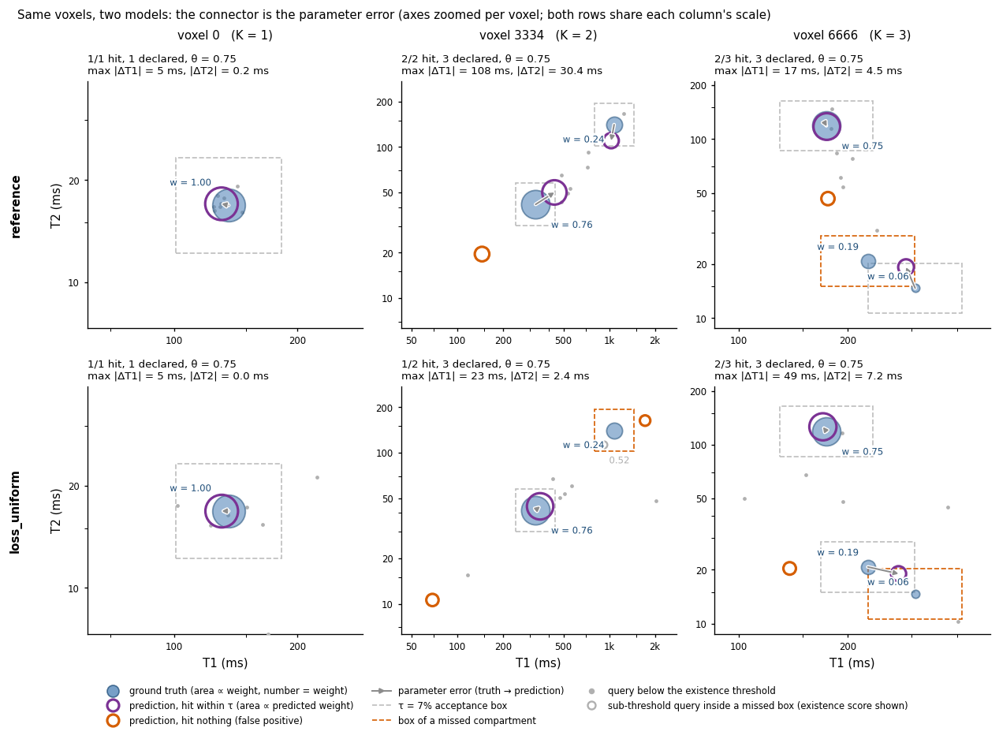

In [11]:
K_true = np.array([len(t) for t in TRUES])

def pick_hard_examples(counts=(1, 2, 3)):
    """First test voxel per K whose smallest true weight is below that K's median."""
    out = {}
    for K in counts:
        idx = np.where(K_true == K)[0]
        minw = np.array([min(c[2] for c in TRUES[i]) for i in idx])
        out[K] = int(idx[0]) if K == 1 else int(idx[np.argmax(minw < np.median(minw))])
    return out

EXAMPLES = pick_hard_examples()
print("example voxel indices:", EXAMPLES)


def outcome_line(view):
    """One-line ND outcome summary for a panel subtitle."""
    K = len(view["gt"])
    hits = len(view["tp_of_gt"])
    nd = len(view["declared"])
    if hits:
        worst1 = max(abs(d["t1"] - view["gt"][g][0]) for g, d in view["tp_of_gt"].items())
        worst2 = max(abs(d["t2"] - view["gt"][g][1]) for g, d in view["tp_of_gt"].items())
        err = f"\nmax |ΔT1| = {worst1:.0f} ms, |ΔT2| = {worst2:.1f} ms"
    else:
        err = ""
    return f"{hits}/{K} hit, {nd} declared, \u03b8 = {view['thresh']:.2f}{err}"


def paired_figure(voxels, arms=(REF_ARM, ARM), name="05_paired_examples",
                  title=None, show_below=True, limits=None, subtitle=None):
    """Rows = models, columns = voxels; identical voxels and limits per column.

    `limits` overrides the per-column zoom with a precomputed {voxel: (xlim, ylim)} map.
    Pass the same map to several figures to make them comparable; otherwise each figure
    zooms to its own arm.
    """
    ncol = len(voxels)
    fig, axes = plt.subplots(len(arms), ncol, figsize=(3.5 * ncol, 3.5 * len(arms)),
                             squeeze=False)
    for c, i in enumerate(voxels):
        views = [voxel_view(a, i) for a in arms]
        xlim, ylim = limits[i] if limits else voxel_limits(views)
        for r, (arm, v) in enumerate(zip(arms, views)):
            ax = axes[r][c]
            draw_voxel(ax, v, xlim=xlim, ylim=ylim, show_below=show_below)
            ax.set_title(outcome_line(v), fontsize=SMALL)
            if r == len(arms) - 1:
                ax.set_xlabel("T1 (ms)")
            if c == 0:
                ax.set_ylabel("T2 (ms)")
        axes[0][c].annotate(f"voxel {i}   (K = {K_true[i]})", xy=(0.5, 1.17),
                            xycoords="axes fraction", ha="center", fontsize=BASE)
    for r, arm in enumerate(arms):
        # the model is named once per row, outside the axes
        axes[r][0].annotate(LABEL.get(arm, arm), xy=(-0.26, 0.5),
                            xycoords="axes fraction", rotation=90, va="center",
                            ha="center", fontsize=BASE, fontweight="bold")
    layout_with_furniture(
        fig, handles=VOXEL_LEGEND, ncol=3,
        title=(title + (subtitle if subtitle is not None else
                        " (axes zoomed per voxel; both rows share each column's scale)"))
        if title else None)
    save(fig, name)
    return fig


fig = paired_figure(
    [EXAMPLES[1], EXAMPLES[2], EXAMPLES[3]],
    title="Same voxels, two models: the connector is the parameter error",
)
plt.show()

## 2.5 Voxels where the two models disagree

The hard-case examples above are a fair sample but not a diagnostic, because both rows
often do the same thing. This selection is the opposite: voxels where the arm hits a compartment
the reference misses, and voxels where the reference hits one the arm misses. These
panels show what the aggregate difference between the two arms consists of.

In [12]:
def hit_matrix(arm):
    """Per voxel: how many ground truths the arm hit under the ND rule."""
    q = Q[arm]
    params, probs, thr = q["params"], q["exist_prob"], q["thresh"]
    hits = np.zeros(len(TRUES), dtype=int)
    ndecl = np.zeros(len(TRUES), dtype=int)
    for i in range(len(TRUES)):
        recs = ndm.voxel_records(params[i], probs[i], TRUES[i], SPANS, TAU,
                                 exist_thresh=thr)
        hits[i] = len({r["gt"] for r in recs if r["gt"] is not None})
        ndecl[i] = len(recs)
    return hits, ndecl


HITS, NDECL = {}, {}
for arm in (REF_ARM, ARM):
    HITS[arm], NDECL[arm] = hit_matrix(arm)
    print(f"{arm:28s} hit {HITS[arm].sum():,} / {K_true.sum():,} ground truths "
          f"({HITS[arm].sum()/K_true.sum():.1%}), "
          f"{NDECL[arm].mean():.2f} declared per voxel")

delta = HITS[ARM] - HITS[REF_ARM]
print(f"\nvoxels where {ARM} hits more : {(delta > 0).sum():,}")
print(f"voxels where {REF_ARM} hits more : {(delta < 0).sum():,}")
print(f"voxels where they tie              : {(delta == 0).sum():,}")

# Deterministic pick: among multi-compartment voxels, the largest disagreement, then the
# smallest true weight (the hardest instance of that disagreement) breaks ties.
def pick_disagreements(sign, n=3, min_K=2):
    """Pick voxels where the models disagree most in the chosen direction."""
    cand = np.where((np.sign(delta) == sign) & (K_true >= min_K))[0]
    if len(cand) == 0:
        return []
    minw = np.array([min(c[2] for c in TRUES[i]) for i in cand])
    order = np.lexsort((minw, -np.abs(delta[cand])))
    return [int(cand[k]) for k in order[:n]]


ARM_WINS = pick_disagreements(+1, 3)
REF_WINS = pick_disagreements(-1, 3)
print("arm-favouring voxels      :", ARM_WINS)
print("reference-favouring voxels:", REF_WINS)

baseline_v2_reproduction     hit 14,736 / 19,998 ground truths (73.7%), 1.89 declared per voxel
loss_uniform                 hit 15,347 / 19,998 ground truths (76.7%), 1.81 declared per voxel

voxels where loss_uniform hits more : 1,007
voxels where baseline_v2_reproduction hits more : 532
voxels where they tie              : 8,460
arm-favouring voxels      : [9766, 7156, 9648]
reference-favouring voxels: [8512, 3617, 6959]


saved figures/06_arm_wins.png


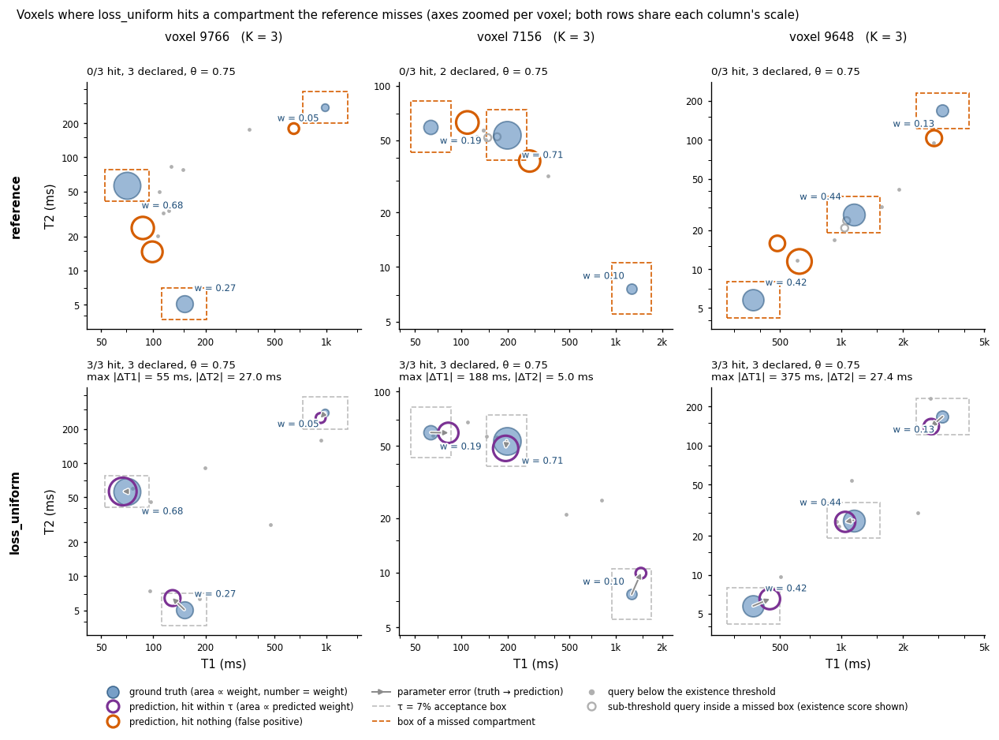

In [13]:
if ARM_WINS:
    fig = paired_figure(ARM_WINS, name="06_arm_wins",
                        title=f"Voxels where {L_ARM} hits a compartment the {L_REF} misses")
    plt.show()
else:
    print(f"no voxel where {ARM} strictly hits more; nothing to draw")

saved figures/07_reference_wins.png  [7 text overlap(s): '0.34' x '0.61'; '0.34' x '0.21'; '0.34' x '0.13']


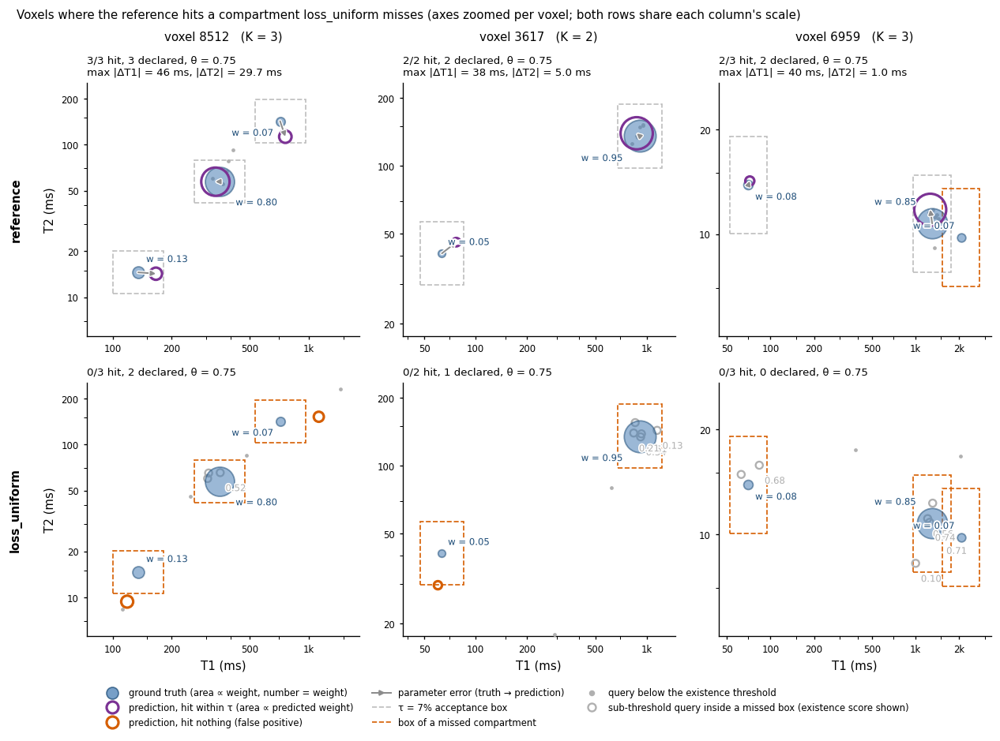

In [14]:
if REF_WINS:
    fig = paired_figure(REF_WINS, name="07_reference_wins",
                        title=f"Voxels where the {L_REF} hits a compartment {L_ARM} misses")
    plt.show()
else:
    print(f"no voxel where {REF_ARM} strictly hits more; nothing to draw")

## 2.6 Outcome gallery: one voxel per outcome type

The same convention, organised by outcome rather than by compartment count. Four
categories, each the first test voxel that qualifies under the arm's own threshold:

1. all hit: every ground truth matched, nothing spurious declared,
2. false positive: a declared prediction outside every τ box,
3. false negative: a ground truth whose box caught no declared prediction,
4. both: one of each in the same voxel.

There is no true-negative panel. A true negative would be a compartment that does not
exist and was not predicted, and a voxel contains infinitely many absent (T1, T2)
points, so TN is undefined here and enters none of the metrics. Precision and recall
are the right summary for this reason.

outcome examples for loss_uniform: {'all hit': 3333, 'false positive': 3424, 'false negative': 3371, 'both': 3334}


saved figures/08_outcome_types.png


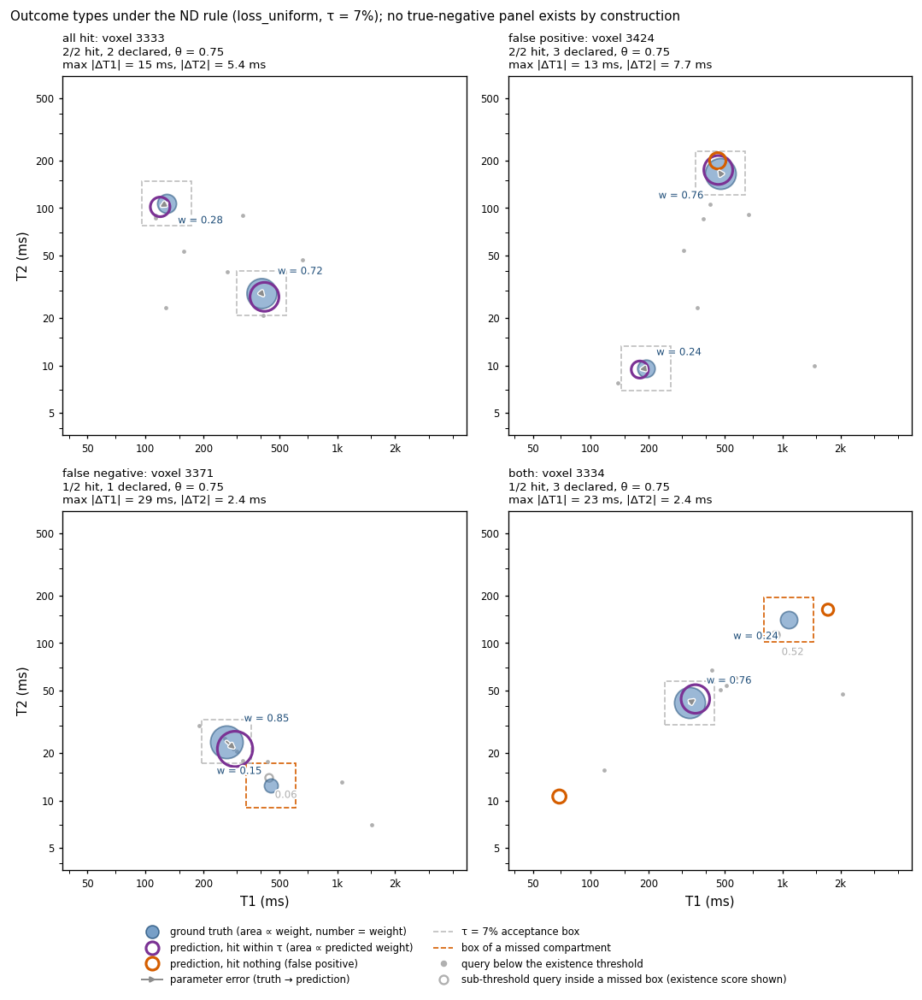

In [15]:
def categorise(arm):
    """First test voxel for each outcome category, under the arm's own threshold."""
    q = Q[arm]
    params, probs, thr = q["params"], q["exist_prob"], q["thresh"]
    want = {"all hit": None, "false positive": None, "false negative": None, "both": None}
    for i in range(len(TRUES)):
        if all(v is not None for v in want.values()):
            break
        if K_true[i] < 2:
            continue                      # multi-compartment voxels only
        recs = ndm.voxel_records(params[i], probs[i], TRUES[i], SPANS, TAU, exist_thresh=thr)
        assigned = {r["gt"] for r in recs if r["gt"] is not None}
        n_fp = sum(1 for r in recs if r["gt"] is None)
        # duplicates on an already-hit GT are FPs too
        seen = {}
        for r in recs:
            if r["gt"] is not None:
                seen[r["gt"]] = seen.get(r["gt"], 0) + 1
        n_fp += sum(c - 1 for c in seen.values())
        n_fn = K_true[i] - len(assigned)
        key = ("both" if (n_fp and n_fn) else
               "false positive" if n_fp else
               "false negative" if n_fn else "all hit")
        if want[key] is None:
            want[key] = int(i)
    return want


CATS = categorise(ARM)
print(f"outcome examples for {ARM}:", CATS)

order = [k for k in ("all hit", "false positive", "false negative", "both")
         if CATS[k] is not None]
nrow = (len(order) + 1) // 2
fig, axes = plt.subplots(nrow, 2, figsize=(9.0, 4.4 * nrow), squeeze=False)
# Every panel shows the full sampled range, padded by one tau half-width so the box
# of a boundary compartment is never cut; identical limits keep the panels comparable.
xlim = (cfg0.data.t1_min / F1, cfg0.data.t1_max * F1)
ylim = (cfg0.data.t2_min / F2, cfg0.data.t2_max * F2)
for c, key in enumerate(order):
    i = CATS[key]
    ax = axes[c // 2][c % 2]
    v = voxel_view(ARM, i)
    draw_voxel(ax, v, xlim=xlim, ylim=ylim)
    for s in ax.spines.values():
        s.set_visible(True)
    ax.set_title(f"{key}: voxel {i}\n{outcome_line(v)}", fontsize=SMALL)
    if c // 2 == nrow - 1:
        ax.set_xlabel("T1 (ms)")
    if c % 2 == 0:
        ax.set_ylabel("T2 (ms)")
for k in range(len(order), nrow * 2):
    axes[k // 2][k % 2].set_visible(False)
layout_with_furniture(
    fig, handles=VOXEL_LEGEND, ncol=2,
    title=f"Outcome types under the ND rule ({L_ARM}, τ = {TAU:.0%}); "
          "no true-negative panel exists by construction")
save(fig, "08_outcome_types")
plt.show()

## 2.7 A gallery of many voxels at once

The single-voxel panels are for reading one error; this figure is for scale. The same
voxels under both models on the full T1-T2 plane, without τ boxes, sub-threshold queries
or error arrows. What can be read here is where compartments sit and how many were hit.
An orange title marks any voxel that was not perfectly recovered, so the failures can be
found by scanning. Parameter errors are not resolvable at this zoom: a hit lies inside
its τ box, and a τ box is smaller than a marker on the full plane, which is what §2.4
zooms in for.

One row per compartment count, because the test split is the three per-K files
concatenated: consecutive indices all have the same K, and a gallery of the first 24
voxels would contain 24 single-compartment voxels.

saved figures/09_gallery_reference.png


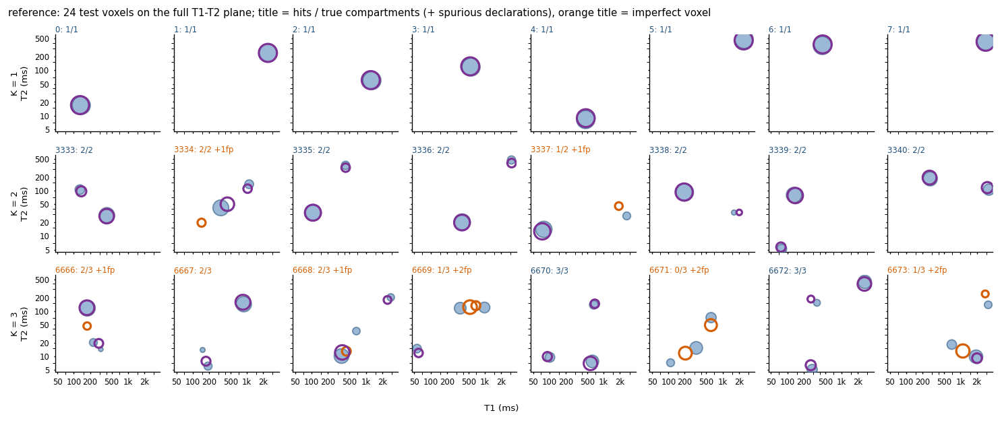

saved figures/10_gallery_arm.png


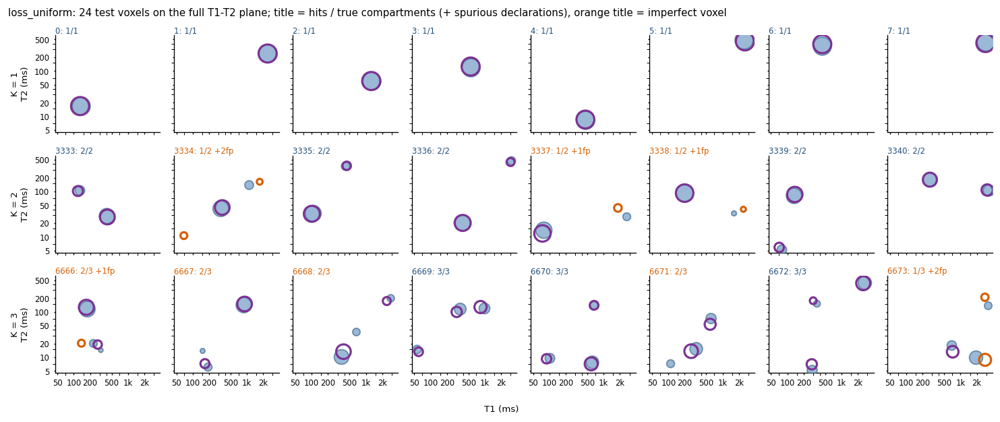

In [16]:
GALLERY_XLIM, GALLERY_YLIM = (45, 3900), (4.5, 620)

# The test split is the n1/n2/n3 files concatenated, so consecutive indices share one K
# (voxels 0..23 are all single-compartment). The gallery takes 8 voxels per K instead,
# so each row is one compartment count.
def gallery_voxels(per_k=8):
    """Pick example voxels for each true compartment count."""
    return [int(np.where(K_true == K)[0][j]) for K in (1, 2, 3) for j in range(per_k)]


def gallery(arm, voxels=None, ncol=8, name=None):
    """Plot example voxels with their true and predicted compartments."""
    voxels = voxels or gallery_voxels(ncol)
    nrow = int(np.ceil(len(voxels) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(1.55 * ncol, 1.66 * nrow),
                             squeeze=False, sharex=True, sharey=True)
    for k in range(nrow * ncol):
        ax = axes[k // ncol][k % ncol]
        if k >= len(voxels):
            ax.set_visible(False)
            continue
        i = voxels[k]
        v = voxel_view(arm, i)
        draw_voxel(ax, v, xlim=GALLERY_XLIM, ylim=GALLERY_YLIM, show_boxes=False,
                   show_below=False, label_w=False, show_error=False, area=260.0)
        hits, K = len(v["tp_of_gt"]), len(v["gt"])
        n_fp = sum(1 for d in v["declared"]
                   if not (d["gt"] is not None and v["tp_of_gt"].get(d["gt"]) is d))
        ax.set_title(f"{i}: {hits}/{K}" + (f" +{n_fp}fp" if n_fp else ""),
                     fontsize=TINY, pad=2,
                     color=C_GT if hits == K and not n_fp else C_FP)
        ax.tick_params(length=1.5)
    for row, K in enumerate((1, 2, 3)):
        axes[row][0].set_ylabel(f"K = {K}\nT2 (ms)", fontsize=SMALL)
    fig.supxlabel("T1 (ms)", fontsize=SMALL)
    layout_with_furniture(
        fig, title=f"{LABEL.get(arm, arm)}: {len(voxels)} test voxels on the full "
                   f"T1-T2 plane; title = hits / true compartments (+ spurious "
                   f"declarations), orange title = imperfect voxel")
    if name:
        save(fig, name)
    return fig


GALLERY_VOXELS = gallery_voxels(8)
for arm, nm in ((REF_ARM, "09_gallery_reference"), (ARM, "10_gallery_arm")):
    fig = gallery(arm, voxels=GALLERY_VOXELS, ncol=8, name=nm)
    plt.show()

## 2.8 What the panels add up to

The panels are examples, so the last cell states the aggregate they are examples of: the
ND-rule numbers for both arms over all test voxels, recomputed from the checkpoints, plus
the paired per-voxel difference. Three checks accompany it.

The first check replays the matching code. The stored evaluation kept its per-voxel,
per-prediction record dump (`_records_tau7`). Re-deriving the aggregates from those
records reproduces the stored numbers to the last digit, so the rule drawn in the panels
is the rule the thesis tables were computed with.

The second check compares the fresh inference with the stored one, to float tolerance.
Re-running the checkpoints gives identical TP/FP/FN counts. On another machine the ms-scale
error means may differ in the seventh decimal, from a different BLAS reduction order, and
that is not a difference in method: a relative shift of about 1e-7 in a predicted T1 cannot
flip a τ = 7 % acceptance decision, so the counts stay the same. Counts are asserted equal;
the means are asserted equal to 1e-5 relative.

The third check is the paired difference: the per-voxel difference in hits with its 95 %
interval. A difference that is visible in the panels but does not clear this interval
says something about three voxels and nothing about the model.

In [17]:
def aggregate(arm):
    """Calculate strict matching metrics and average precision for a model."""
    q = Q[arm]
    recs, n_gt = ndm.dataset_records(q, TRUES, SPANS, TAU, exist_thresh=q["thresh"])
    m = ndm.exact_metrics_from_records(recs, n_gt)
    recs0, n_gt0 = ndm.dataset_records(q, TRUES, SPANS, TAU, exist_thresh=0.0)
    m["mAP@7"] = ndm.map_101_from_records(recs0, n_gt0)[0]
    return m


AGG = pd.DataFrame({LABEL.get(a, a): aggregate(a) for a in (REF_ARM, ARM)}).T
cols = ["mAP@7", "precision", "recall", "f1", "TP", "FP", "FN",
        "mean_dt1_ms", "mean_dt2_ms", "mean_dw", "mean_pred_per_voxel"]
print(AGG[cols].to_string(float_format=lambda v: f"{v:.4f}"))

KEYS = ("mAP@7", "precision", "recall", "f1", "TP", "FP", "FN",
        "mean_dt1_ms", "mean_dt2_ms", "mean_dw")


def stored_ref(arm):
    """Read saved evaluation scores for comparison with recomputed results."""
    s = json.load(open(f"results/nd_evaluation/{arm}.json"))
    ref = dict(s["exact_at_threshold"])
    ref["mAP@7"] = s["map"]["map@7"]
    return s, ref


# --- check 1: the matching code, replayed on the evaluation's own stored records
print("\ncheck 1: aggregates re-derived from the stored _records_tau7 dump:")
for arm in (REF_ARM, ARM):
    s, ref = stored_ref(arm)
    thr = s["existence_threshold"]
    recs = [[r for r in v if r["prob"] >= thr] for v in s["_records_tau7"]]
    m = ndm.exact_metrics_from_records(recs, np.array(s["_n_gt"]))
    # Counts must be identical. The error means are sums over ~15k terms, so they are
    # allowed one ULP of summation-order difference and nothing more.
    for k in ("TP", "FP", "FN"):
        assert int(m[k]) == int(ref[k]), f"{arm}: {k} does not re-derive"
    for k in ("precision", "recall", "f1", "mean_dt1_ms", "mean_dt2_ms", "mean_dw"):
        assert np.isclose(m[k], ref[k], rtol=1e-12, atol=0), \
            f"{arm}: {k} does not re-derive ({m[k]!r} vs {ref[k]!r})"
    ulp = max(abs(float(m[k]) - float(ref[k])) / np.spacing(abs(float(ref[k])))
              for k in ("mean_dt1_ms", "mean_dt2_ms", "mean_dw"))
    print(f"  {arm:28s} TP/FP/FN identical ({m['TP']}/{m['FP']}/{m['FN']}), "
          f"error means agree to {ulp:.0f} ULP")

# --- check 2: fresh inference from the checkpoints, to float tolerance
print("\ncheck 2: fresh inference from checkpoints vs the stored evaluation:")
worst = 0.0
for arm in (REF_ARM, ARM):
    _, ref = stored_ref(arm)
    mine = AGG.loc[LABEL.get(arm, arm)]
    for key in ("TP", "FP", "FN"):
        assert int(mine[key]) == int(ref[key]), (
            f"{arm}: {key} changed ({int(mine[key])} vs {int(ref[key])}); that is a "
            "method difference, not float noise")
    for key in KEYS:
        rel = abs(float(mine[key]) - float(ref[key])) / max(1e-12, abs(float(ref[key])))
        worst = max(worst, rel)
    print(f"  {arm:28s} counts identical; worst relative Δ over {len(KEYS)} metrics "
          f"{max(abs(float(mine[k]) - float(ref[k])) / max(1e-12, abs(float(ref[k]))) for k in KEYS):.1e}")
assert worst < 1e-5, f"fresh inference disagrees beyond float noise (worst {worst:.2e})"
print("  -> figures and thesis tables describe the same models at the same threshold")

# --- check 3: the paired per-voxel difference the disagreement panels sampled
n = len(delta)
mean_d = float(delta.mean())
se = float(delta.std(ddof=1)) / np.sqrt(n)
print(f"\npaired per-voxel hit difference ({ARM} − {REF_ARM}):")
print(f"  mean {mean_d:+.4f} compartments/voxel, 95% CI "
      f"[{mean_d - 1.96*se:+.4f}, {mean_d + 1.96*se:+.4f}]  (n = {n:,} voxels)")
print(f"  wins {(delta > 0).sum():,} / losses {(delta < 0).sum():,} / "
      f"ties {(delta == 0).sum():,}")
lo, hi = mean_d - 1.96 * se, mean_d + 1.96 * se
if lo <= 0 <= hi:
    print("  the interval spans zero -> the two arms detect equally many compartments; the "
          "disagreement\n  panels above show WHERE they differ, not that one is better")
else:
    print(f"  the interval excludes zero -> {LABEL[ARM] if mean_d > 0 else LABEL[REF_ARM]} "
          f"detects more compartments per voxel;\n  the disagreement panels above show "
          "where that difference is won and lost")

              mAP@7  precision  recall     f1         TP        FP        FN  mean_dt1_ms  mean_dt2_ms  mean_dw  mean_pred_per_voxel
reference    0.6671     0.7785  0.7369 0.7571 14736.0000 4193.0000 5262.0000      59.2479       6.6630   0.0466               1.8931
loss_uniform 0.7719     0.8460  0.7674 0.8048 15347.0000 2794.0000 4651.0000      59.4284       6.4979   0.0446               1.8143

check 1: aggregates re-derived from the stored _records_tau7 dump:
  baseline_v2_reproduction     TP/FP/FN identical (14736/4193/5262), error means agree to 0 ULP


  loss_uniform                 TP/FP/FN identical (15347/2794/4651), error means agree to 0 ULP

check 2: fresh inference from checkpoints vs the stored evaluation:
  baseline_v2_reproduction     counts identical; worst relative Δ over 10 metrics 0.0e+00
  loss_uniform                 counts identical; worst relative Δ over 10 metrics 0.0e+00
  -> figures and thesis tables describe the same models at the same threshold

paired per-voxel hit difference (loss_uniform − baseline_v2_reproduction):
  mean +0.0611 compartments/voxel, 95% CI [+0.0522, +0.0700]  (n = 9,999 voxels)
  wins 1,007 / losses 532 / ties 8,460
  the interval excludes zero -> loss_uniform detects more compartments per voxel;
  the disagreement panels above show where that difference is won and lost


---
## 2.9 Every arm on the same three voxels

One figure per experiment arm, each against the same reference baseline, each on the
same three voxels, one per compartment count. Two properties make the set comparable:

* the voxels are fixed across every arm, so a difference between two figures is a
  difference between two models and not between two voxels;
* the axis limits are computed once, over the reference and every arm at that voxel,
  and reused for all of them. Otherwise each figure would zoom to its own arm's
  predictions, and panels that look alike would be at different scales.

`data_loguniform` is excluded: it was trained and tested on a different dataset, so its
voxel indices do not refer to the same voxels.

In [18]:
GALLERY_ARMS = [
    # ten of the eleven single-change arms (data_loguniform excluded: different test
    # set, so voxel i is not the same voxel)
    "loss_uniform", "exist_weight_03", "physics_clean", "physics_noisy",
    "queries_4", "queries_6", "decoder_2", "decoder_6", "exist_head_shared",
    "aux_loss",
    # the combined models
    "baseline_v3", "baseline_v3_no_sqrt", "baseline_v3_no_physics", "baseline_v4",
    "final_uniform_q6_seed20260724",
]
DISPLAY = {"final_uniform_q6_seed20260724": "final_uniform_q6"}

# every arm must share the reference's test files, or the voxel indices are not comparable
for a in GALLERY_ARMS:
    assert _test_paths(a) == _test_paths(REF_ARM), f"{a} uses a different test set"

for a in GALLERY_ARMS:                      # inference is cached per arm
    if a not in Q:
        Q[a] = query_table(a)
    LABEL.setdefault(a, DISPLAY.get(a, a))

VOX = [EXAMPLES[k] for k in (1, 2, 3)]
print("voxels used for every arm:", {f"K={k}": EXAMPLES[k] for k in (1, 2, 3)})

# ONE zoom per voxel, computed over the reference and every arm at once
SHARED_LIMITS = {
    i: voxel_limits([voxel_view(a, i) for a in [REF_ARM] + GALLERY_ARMS])
    for i in VOX
}
for i in VOX:
    (x0, x1), (y0, y1) = SHARED_LIMITS[i]
    print(f"  voxel {i:5d}: T1 {x0:7.1f}-{x1:7.1f} ms   T2 {y0:6.1f}-{y1:6.1f} ms")

voxels used for every arm: {'K=1': 0, 'K=2': 3334, 'K=3': 6666}
  voxel     0: T1    61.0-  286.6 ms   T2    7.2-  38.6 ms
  voxel  3334: T1    42.7- 2773.9 ms   T2    6.3- 273.3 ms
  voxel  6666: T1    83.3-  493.7 ms   T2    8.8- 216.2 ms


saved figures/arms/loss_uniform_examples.png


saved figures/arms/exist_weight_03_examples.png


saved figures/arms/physics_clean_examples.png


saved figures/arms/physics_noisy_examples.png


saved figures/arms/queries_4_examples.png


saved figures/arms/queries_6_examples.png


saved figures/arms/decoder_2_examples.png


saved figures/arms/decoder_6_examples.png


saved figures/arms/exist_head_shared_examples.png


saved figures/arms/aux_loss_examples.png


saved figures/arms/baseline_v3_examples.png


saved figures/arms/baseline_v3_no_sqrt_examples.png


saved figures/arms/baseline_v3_no_physics_examples.png


saved figures/arms/baseline_v4_examples.png


saved figures/arms/final_uniform_q6_examples.png
                   arm             K=1             K=2             K=3
             reference 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 3 decl
          loss_uniform 1/1 hit, 1 decl 1/2 hit, 3 decl 2/3 hit, 3 decl
       exist_weight_03 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 3 decl
         physics_clean 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 3 decl
         physics_noisy 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 3 decl
             queries_4 1/1 hit, 1 decl 2/2 hit, 2 decl 2/3 hit, 2 decl
             queries_6 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 2 decl
             decoder_2 1/1 hit, 1 decl 1/2 hit, 3 decl 2/3 hit, 3 decl
             decoder_6 1/1 hit, 1 decl 2/2 hit, 3 decl 2/3 hit, 3 decl
     exist_head_shared 1/1 hit, 1 decl 1/2 hit, 3 decl 2/3 hit, 3 decl
              aux_loss 1/1 hit, 1 decl 1/2 hit, 3 decl 2/3 hit, 3 decl
           baseline_v3 1/1 hit, 1 decl 1/2 hit, 2 decl 2/3 hit, 2 decl
   baseline_v3_no_sqrt 1/1 h

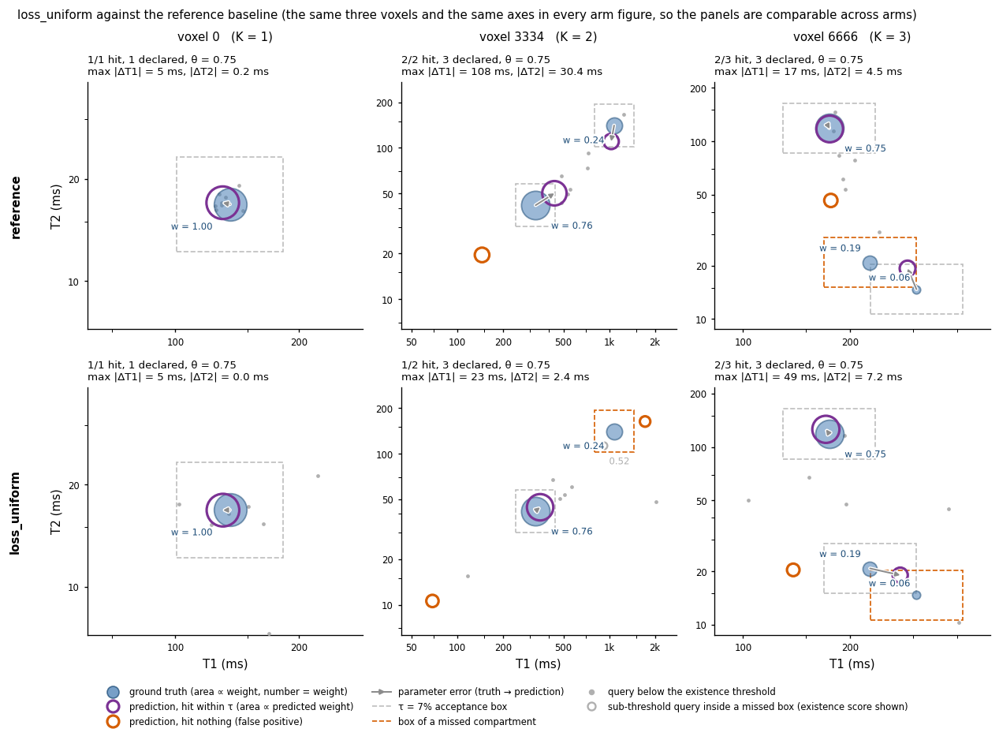

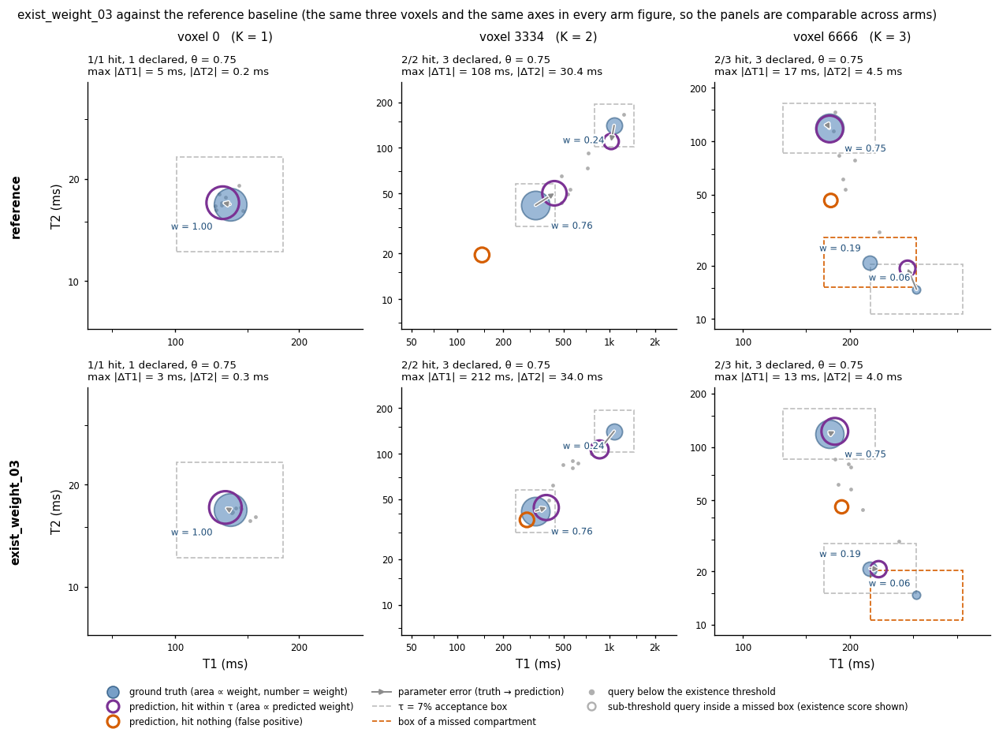

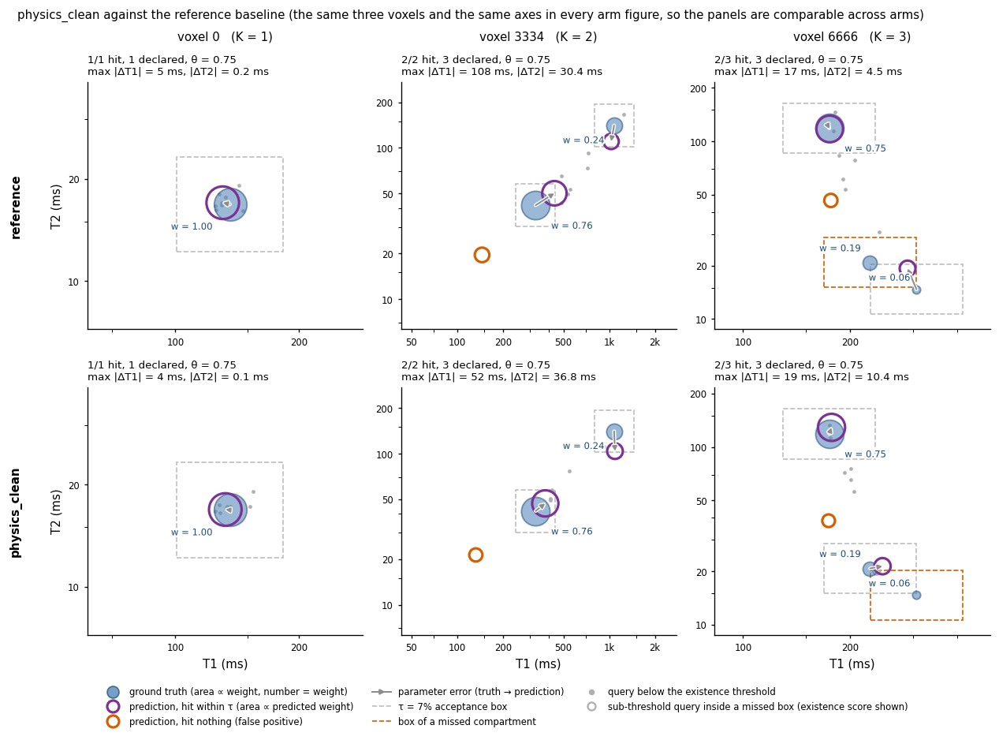

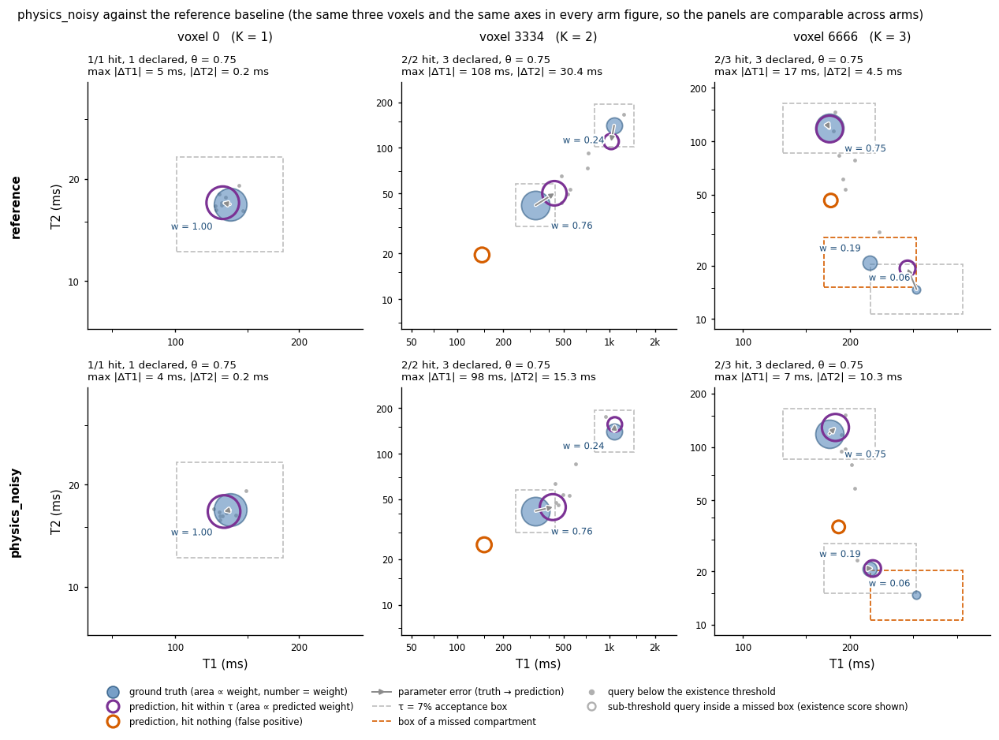

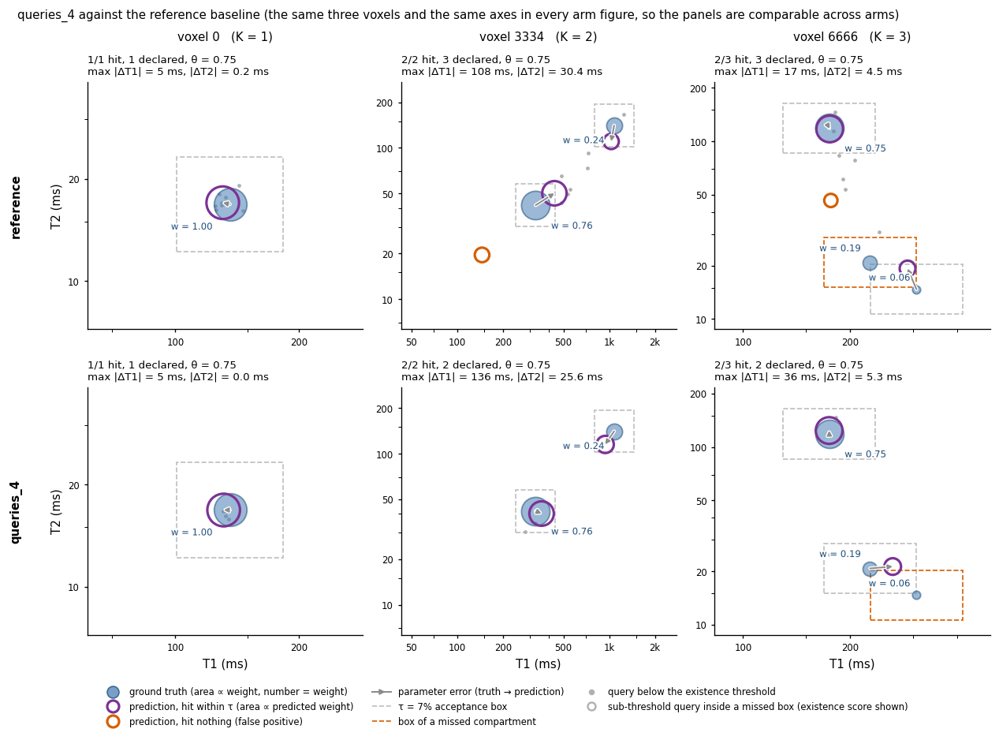

...

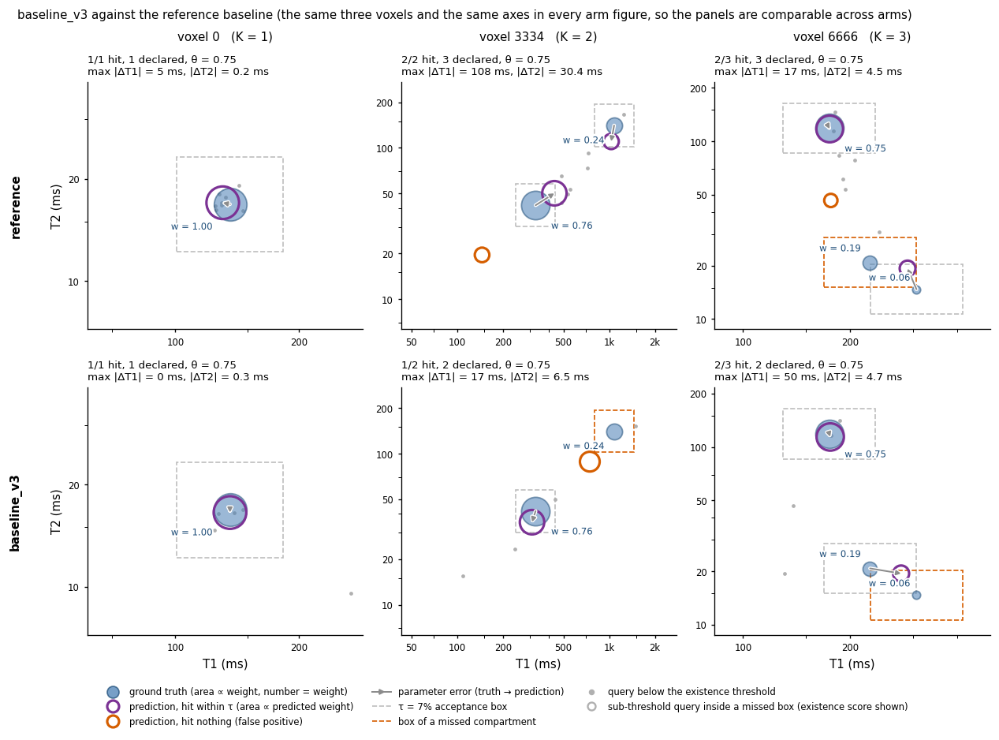

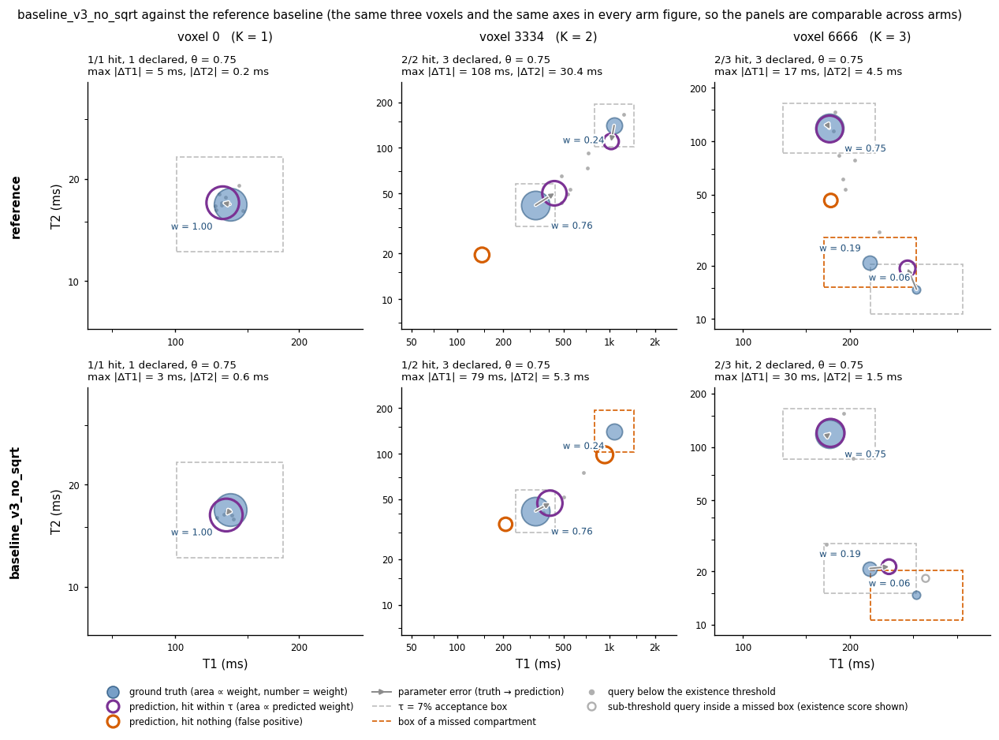

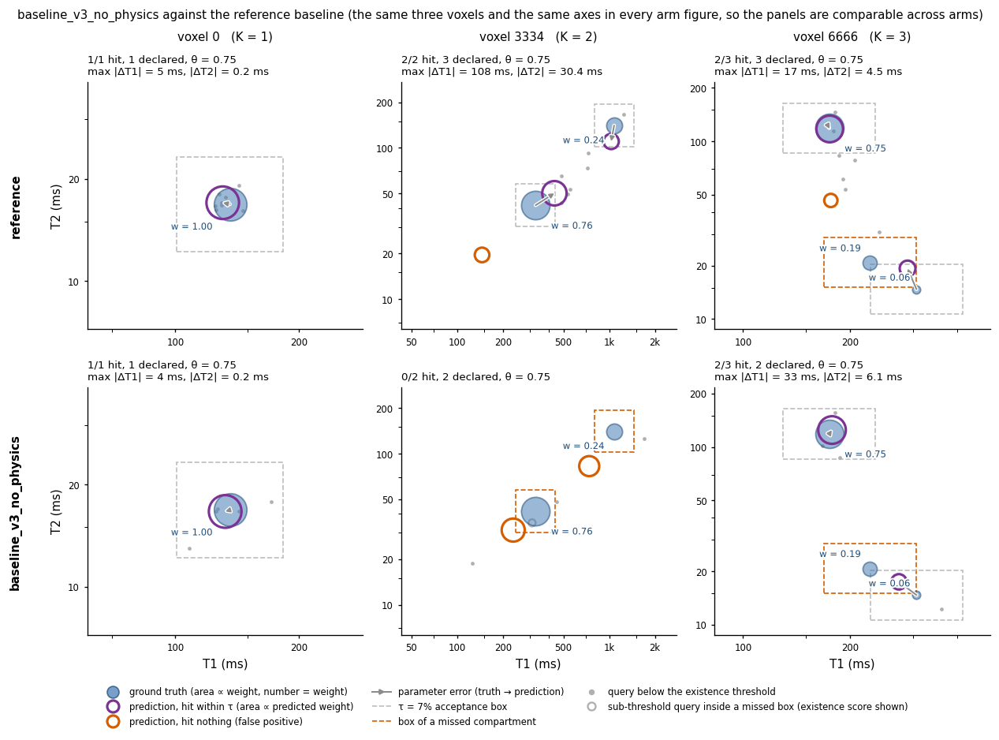

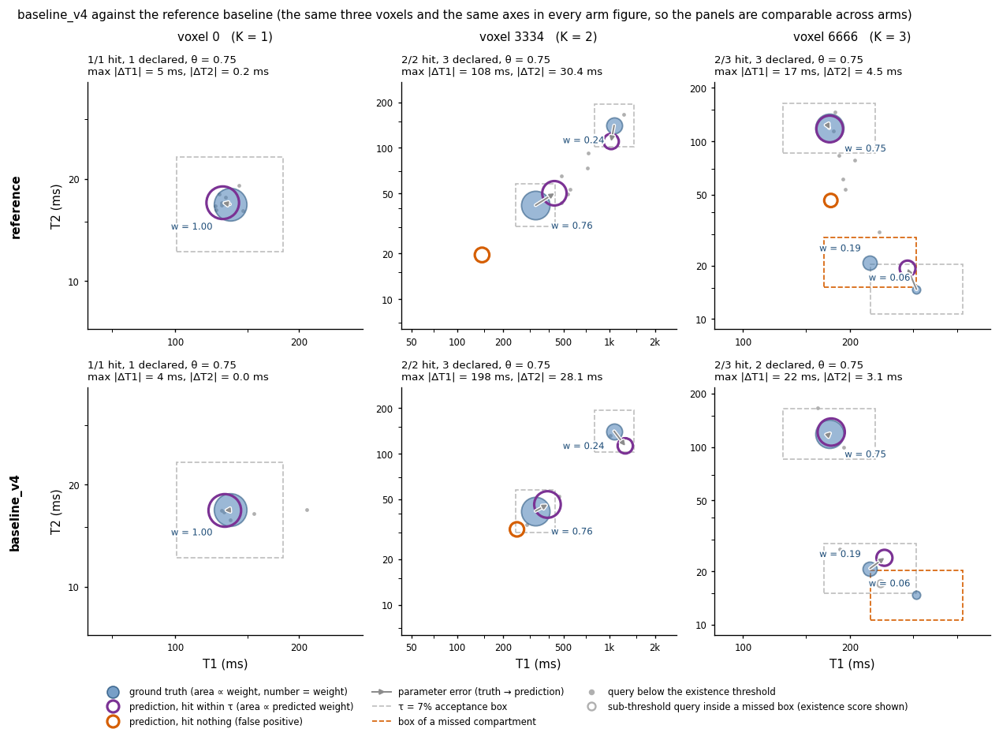

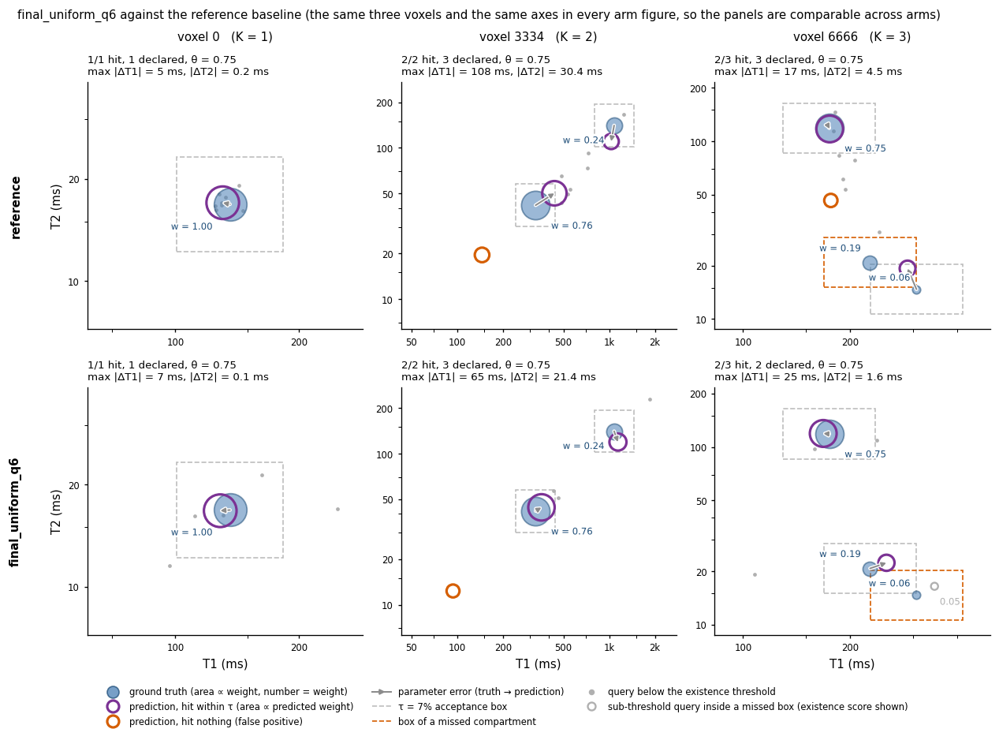

In [19]:
SUB = (" (the same three voxels and the same axes in every arm figure, "
       "so the panels are comparable across arms)")

for a in GALLERY_ARMS:
    # figures are left open: the harness captures every open figure, so all fifteen
    # render inline as well as being written to disk
    paired_figure(
        VOX, arms=(REF_ARM, a), name=f"arms/{LABEL[a]}_examples",
        title=f"{LABEL[a]} against the reference baseline",
        limits=SHARED_LIMITS, subtitle=SUB)

# index table of the per-arm outcomes
rows = []
for a in GALLERY_ARMS:
    r = {"arm": LABEL[a]}
    for k in (1, 2, 3):
        v = voxel_view(a, EXAMPLES[k])
        r[f"K={k}"] = f"{len(v['tp_of_gt'])}/{len(v['gt'])} hit, {len(v['declared'])} decl"
    rows.append(r)
ref_row = {"arm": LABEL[REF_ARM]}
for k in (1, 2, 3):
    v = voxel_view(REF_ARM, EXAMPLES[k])
    ref_row[f"K={k}"] = f"{len(v['tp_of_gt'])}/{len(v['gt'])} hit, {len(v['declared'])} decl"
print(pd.DataFrame([ref_row] + rows).to_string(index=False))
print(f"\nwrote {len(GALLERY_ARMS)} per-arm figures to figures/arms/")

### Reusing this notebook for another comparison

Change `ARM` and `REF_ARM` in the configuration cell and re-run. Any two arms evaluated
on the same test files work; the assertion in that cell rejects pairs that were not, and
the inference cache makes a second run of an already-seen arm free. Every figure is also
written to `figures/` at 300 dpi for inclusion in the thesis.

---
# Part 3: the results

Everything below is read from files that are committed with the repository: the run
metrics under `results/` and the figures under `figures/`. No number is typed in. Where a figure is made by a script in
`evaluation/figures/` (they need the checkpoints, which are not committed), the cell
shows the committed image; the regeneration cell at the end of this part re-runs the
scripts when the checkpoints are present.

Two conventions hold throughout. Strict voxel accuracy means the right number of
compartments and every one of them inside the tau = 7 % box, scored at the existence
threshold each run chose on its own validation split (`results/threshold_val/`). mAP@7
is threshold-free. The reference was trained at four seeds, and the spread over those
four runs is the ruler every difference is judged against.

In [20]:
import subprocess
from PIL import Image

RES, FIG = Path("results"), Path("figures")
HAVE_CKPT = (RES / ARM / "checkpoints" / "best.pt").exists()


def jload(p, default=None):
    """Read a JSON file, using a default if it is missing."""
    p = Path(p)
    return json.load(open(p)) if p.exists() else default


def show(name, width=900, optional=False):
    """Display a figure from figures/ (or a path), downscaled for the notebook."""
    p = Path(name) if str(name).endswith(".png") else FIG / f"{name}.png"
    if not p.exists():
        if not optional:
            print(f"[missing] {p}: see evaluation/figures/README.md for the script that makes it")
        return
    im = Image.open(p).convert("RGB")
    if im.width > width:
        im = im.resize((width, round(im.height * width / im.width)), Image.LANCZOS)
    display(im)


RUNS = sorted(p.name for p in RES.iterdir()
               if (p / "summary.json").exists() and (p / "config.yaml").exists())
REF_SEEDS = [REF_ARM, "baseline_seed20260725", "baseline_seed20260726", "baseline_seed20260727"]
LU_SEEDS = ["loss_uniform", "loss_uniform_seed20260725", "loss_uniform_seed20260726",
            "loss_uniform_seed20260727"]
FQ6_SEEDS = [f"final_uniform_q6_seed{s}" for s in (20260724, 20260725, 20260726, 20260727)]
ARMS = ["loss_uniform", "aux_loss", "physics_noisy", "physics_clean", "queries_6",
        "exist_head_shared", "decoder_6", "queries_4", "decoder_2", "exist_weight_03",
        "data_loguniform"]
COMBINED = ["baseline_v3", "baseline_v3_no_sqrt", "baseline_v3_no_physics", "baseline_v4"]
CHANGE = {
    "loss_uniform": "no signal-fraction weighting in the loss",
    "aux_loss": "loss on every decoder layer",
    "physics_noisy": "signal-consistency term, measured target",
    "physics_clean": "signal-consistency term, noise-free target",
    "queries_6": "6 queries instead of 10",
    "exist_head_shared": "shared existence head",
    "decoder_6": "6 decoder layers",
    "queries_4": "4 queries",
    "decoder_2": "2 decoder layers",
    "exist_weight_03": "existence weight 0.1 to 0.3",
    "data_loguniform": "log-uniform T1 sampling (other test set)",
    "baseline_v3": "2 layers, 6 queries, shared head, sqrt(w) weighting, consistency term",
    "baseline_v3_no_sqrt": "v3 with signal-fraction weighting back",
    "baseline_v3_no_physics": "v3 without the consistency term",
    "baseline_v4": "6 queries, shared head, consistency term",
    "final_uniform_q6": "uniform weighting and 6 queries",
}
ND = pd.read_csv(RES / "nd_evaluation" / "nd_metrics_all_models.csv").set_index("model")


def theta_cal(run):
    """Read the confidence threshold chosen on validation data."""
    return float(jload(RES / "threshold_val" / f"{run}.json")["val_theta"])


def strict_cal(run):
    """Read strict test accuracy at the validation-chosen threshold."""
    return float(jload(RES / "threshold_val" / f"{run}.json")["test_voxel_acc_at_val_theta"])


def sweep_at(run, theta, key):
    """A quantity from the test-set threshold sweep at the threshold nearest to theta."""
    rows = jload(RES / "threshold_sweep" / f"{run}.json")["2d"]
    return float(min(rows, key=lambda r: abs(r["threshold"] - theta))[key])


def count_cal(run):
    """Get count accuracy at the validation-chosen threshold."""
    return sweep_at(run, theta_cal(run), "count_acc")


def map7(run):
    """Read average precision at 7% matching tolerance."""
    return float(ND.loc[run, "mAP@7"])


def metrics(run):
    """Read a run's saved evaluation metrics."""
    return jload(RES / run / "metrics_detr.json")


def summary(run):
    """Read a run's saved experiment summary."""
    return jload(RES / run / "summary.json")


def recovery_bins(run):
    """Read recovery results grouped by true signal fraction."""
    return jload(RES / run / "parameter_recovery_detr.json")["bins"]


def mean_range(vals):
    """Return the average and the gap between largest and smallest values."""
    vals = np.asarray(vals, float)
    return float(vals.mean()), float(vals.max() - vals.min())


SPREAD_STRICT = mean_range([strict_cal(r) for r in REF_SEEDS])[1]
SPREAD_MAP = mean_range([map7(r) for r in REF_SEEDS])[1]
print(f"{len(RUNS)} finished runs under results/; checkpoints present: {HAVE_CKPT}")
print(f"seed spread of the reference: {SPREAD_STRICT:.2f} pp strict accuracy, {SPREAD_MAP:.4f} mAP@7")

26 finished runs under results/; checkpoints present: True
seed spread of the reference: 0.81 pp strict accuracy, 0.0168 mAP@7


## 3.1 What was trained

One row per run: the epochs it ran, the epoch its best checkpoint comes from, the wall
time, and the parameter count of the network the config describes. Every run had a
500-epoch budget and stopped early on the validation parameter loss with a patience of
35 epochs.

,seed,queries,decoder layers,existence head,loss weighting,consistency term,parameters,epochs run,best epoch,early stopped,wall (min)
run,,,,,,,,,,,
aux_loss,20260724,10,4,joint,signal_fraction,off,4.51 M,181,146,True,68.4
baseline_seed20260725,20260725,10,4,joint,signal_fraction,off,4.51 M,187,152,True,30.4
baseline_seed20260726,20260726,10,4,joint,signal_fraction,off,4.51 M,204,169,True,32.4
baseline_seed20260727,20260727,10,4,joint,signal_fraction,off,4.51 M,166,131,True,26.4
baseline_v2_reproduction,20260724,10,4,joint,signal_fraction,off,4.51 M,199,164,True,31.2
baseline_v3,20260724,6,2,shared,sqrt,on,2.81 M,151,116,True,16.2
baseline_v3_no_physics,20260724,6,2,shared,sqrt,off,2.81 M,183,148,True,18.2
baseline_v3_no_sqrt,20260724,6,2,shared,signal_fraction,on,2.81 M,152,117,True,15.9
baseline_v4,20260724,6,4,shared,signal_fraction,on,4.39 M,158,123,True,21.4


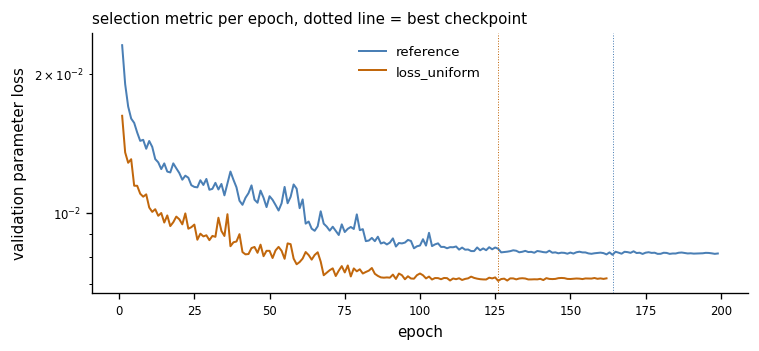

In [21]:
rows = []
for run in RUNS:
    s, cfg = summary(run), _cfg(run)
    n_params = sum(p.numel() for p in build_model(cfg.model).parameters())
    rows.append({
        "run": run, "seed": cfg.train.seed, "queries": cfg.model.n_queries,
        "decoder layers": cfg.model.n_dlayers, "existence head": cfg.model.exist_head,
        "loss weighting": cfg.loss.t1_t2_weighting,
        "consistency term": "on" if cfg.loss.signal_consistency else "off",
        "parameters": f"{n_params/1e6:.2f} M",
        "epochs run": s["epochs_run"], "best epoch": s["best_epoch"],
        "early stopped": s["early_stopped"], "wall (min)": round(s["wall_seconds"] / 60, 1),
    })
TRAINED = pd.DataFrame(rows).set_index("run")
display(TRAINED)

fig, ax = plt.subplots(figsize=(6.4, 3.0))
for run, colour, label in ((REF_ARM, C_REF, L_REF), (ARM, C_ARM, L_ARM)):
    hist = jload(RES / run / "history.json")
    ax.plot([h["epoch"] + 1 for h in hist], [h["val"]["parameter_loss"] for h in hist],
            color=colour, lw=1.2, label=label)
    best = summary(run)["best_epoch"]
    ax.axvline(best, color=colour, lw=0.6, ls=":")
ax.set_xlabel("epoch"); ax.set_ylabel("validation parameter loss"); ax.set_yscale("log")
ax.set_title("selection metric per epoch, dotted line = best checkpoint")
ax.legend()
fig.tight_layout()

## 3.2 The reference, per compartment count

The reference solves almost every one-compartment voxel and almost no three-compartment
voxel. Means over the four seeds with the range over seeds in brackets; count and strict
accuracy at the calibrated threshold, parameter errors over the matched compartments at
each run's fitted threshold.

In [22]:
RS = jload(RES / "review_stats.json")
rows = []
for k in "123":
    t1 = [metrics(r)[f"n{k}_t1_rel_median"] * 100 for r in REF_SEEDS]
    t2 = [metrics(r)[f"n{k}_t2_rel_median"] * 100 for r in REF_SEEDS]
    row = {"K": int(k)}
    if RS:
        byk = RS["families"]["baseline"]["calibrated"]["by_k"][k]
        row.update({"count acc (%)": f"{byk['count_acc']['mean']:.2f} [{byk['count_acc']['range']:.2f}]",
                    "strict acc (%)": f"{byk['strict_acc']['mean']:.2f} [{byk['strict_acc']['range']:.2f}]"})
    row.update({"rel. T1 error (%)": f"{np.mean(t1):.2f} [{np.ptp(t1):.2f}]",
                "rel. T2 error (%)": f"{np.mean(t2):.2f} [{np.ptp(t2):.2f}]"})
    rows.append(row)
display(pd.DataFrame(rows).set_index("K"))
if not RS:
    print("results/review_stats.json not found; "
          "count and strict accuracy per K are omitted")

,count acc (%),strict acc (%),rel. T1 error (%),rel. T2 error (%)
K,,,,
1,98.00 [0.84],97.90 [0.75],1.32 [0.13],1.74 [0.12]
2,81.50 [1.08],65.49 [1.02],4.76 [0.25],5.93 [0.28]
3,49.71 [2.61],9.50 [2.49],12.00 [1.08],13.46 [1.02]


## 3.3 The ruler: four seeds of the reference

A single run has no error bar. The reference was retrained at three more seeds, fixed
before any of them was run. The four runs are equally good on the metric they were
selected by and still differ in what they detect.

In [23]:
seeds = [str(_cfg(r).train.seed) for r in REF_SEEDS]
quant = {
    "validation parameter loss (selection)": [summary(r)["best_val"] for r in REF_SEEDS],
    "strict acc, calibrated theta (%)": [strict_cal(r) for r in REF_SEEDS],
    "count acc, calibrated theta (%)": [count_cal(r) for r in REF_SEEDS],
    "strict acc, theta = 0.50 (%)": [sweep_at(r, 0.5, "voxel_acc") for r in REF_SEEDS],
    "strict acc, theta = 0.75 (%)": [sweep_at(r, 0.75, "voxel_acc") for r in REF_SEEDS],
    "mAP@7 (no threshold)": [map7(r) for r in REF_SEEDS],
}
rows = []
for name, vals in quant.items():
    dec = 5 if "loss" in name else (4 if "mAP" in name else 2)
    m, rng = mean_range(vals)
    rows.append({"quantity": name, **{s: f"{v:.{dec}f}" for s, v in zip(seeds, vals)},
                 "range": f"{rng:.{dec}f}", "std": f"{np.std(vals, ddof=1):.{dec}f}"})
display(pd.DataFrame(rows).set_index("quantity"))

,20260724,20260725,20260726,20260727,range,std
quantity,,,,,,
validation parameter loss (selection),0.00810,0.00824,0.00833,0.00814,0.00023,0.00010
"strict acc, calibrated theta (%)",57.98,57.64,57.17,57.75,0.81,0.34
"count acc, calibrated theta (%)",76.61,76.69,76.09,76.24,0.60,0.29
"strict acc, theta = 0.50 (%)",47.35,46.49,46.20,48.15,1.95,0.88
"strict acc, theta = 0.75 (%)",55.91,55.18,55.05,55.59,0.86,0.39
mAP@7 (no threshold),0.6671,0.6687,0.6520,0.6688,0.0168,0.0081


## 3.4 Eleven single changes

Each arm changes exactly one design choice relative to the reference and is a single run
at the shared seed. A change counts only if it clears the seed spread. The lollipops show
the difference to the reference; the grey band is the spread.

,what changed,theta,strict acc (%),delta (pp),mAP@7,delta mAP,precision,recall,verdict
arm,,,,,,,,,
baseline_v2_reproduction,reference,0.90,57.98,+0.00,0.6671,+0.0000,0.778,0.737,reference
loss_uniform,no signal-fraction weighting in the loss,0.85,62.13,+4.15,0.7719,+0.1048,0.846,0.767,better
aux_loss,loss on every decoder layer,0.90,58.23,+0.25,0.6721,+0.0050,0.784,0.741,flat
physics_noisy,"signal-consistency term, measured target",0.95,58.05,+0.07,0.6751,+0.0080,0.783,0.743,flat
physics_clean,"signal-consistency term, noise-free target",0.90,57.86,-0.12,0.6672,+0.0001,0.781,0.739,flat
queries_6,6 queries instead of 10,0.90,57.76,-0.22,0.6604,-0.0067,0.803,0.727,flat
exist_head_shared,shared existence head,0.95,57.72,-0.26,0.6643,-0.0028,0.776,0.736,flat
decoder_6,6 decoder layers,0.90,57.33,-0.65,0.6604,-0.0067,0.775,0.732,flat
queries_4,4 queries,0.85,57.31,-0.67,0.6529,-0.0142,0.810,0.719,flat


saved figures/21_arm_deltas.png


PosixPath('figures/21_arm_deltas.png')

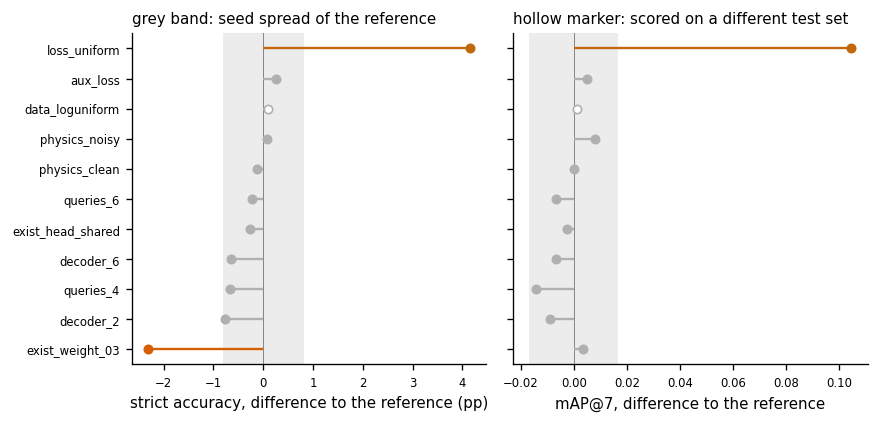

In [24]:
rows = []
for a in [REF_ARM] + ARMS:
    r = ND.loc[a]
    d_s = strict_cal(a) - strict_cal(REF_ARM)
    d_m = map7(a) - map7(REF_ARM)
    if a == REF_ARM:
        verdict = "reference"
    elif a == "data_loguniform":
        verdict = "other test set"
    elif abs(d_s) > SPREAD_STRICT or abs(d_m) > SPREAD_MAP:
        verdict = "better" if d_s > 0 else "worse"
    else:
        verdict = "flat"
    rows.append({"arm": a, "what changed": CHANGE.get(a, "reference"),
                 "theta": f"{theta_cal(a):.2f}", "strict acc (%)": f"{strict_cal(a):.2f}",
                 "delta (pp)": f"{d_s:+.2f}", "mAP@7": f"{map7(a):.4f}",
                 "delta mAP": f"{d_m:+.4f}", "precision": f"{r['precision']:.3f}",
                 "recall": f"{r['recall']:.3f}", "verdict": verdict,
                 "_ds": d_s, "_dm": d_m})
ARMTAB = pd.DataFrame(rows).set_index("arm")
display(ARMTAB.drop(columns=["_ds", "_dm"]))

sub = ARMTAB.drop(index=REF_ARM).sort_values("_ds")
fig, axes = plt.subplots(1, 2, figsize=(7.4, 3.6), sharey=True)
y = np.arange(len(sub))
for ax, col, band, xlabel in ((axes[0], "_ds", SPREAD_STRICT, "strict accuracy, difference to the reference (pp)"),
                              (axes[1], "_dm", SPREAD_MAP, "mAP@7, difference to the reference")):
    ax.axvspan(-band, band, color="#ececec", lw=0, zorder=0)
    ax.axvline(0, color="#888888", lw=0.6)
    for yi, (arm, row) in zip(y, sub.iterrows()):
        d = row[col]
        other = arm == "data_loguniform"
        colour = C_NOISE if (abs(d) <= band or other) else (C_ARM if d > 0 else C_FP)
        ax.hlines(yi, 0, d, color=colour, lw=1.4)
        ax.plot(d, yi, "o", ms=5, mfc="white" if other else colour, mec=colour)
    ax.set_xlabel(xlabel)
axes[0].set_yticks(y); axes[0].set_yticklabels(list(sub.index))
axes[0].set_title("grey band: seed spread of the reference")
axes[1].set_title("hollow marker: scored on a different test set")
fig.tight_layout()
save(fig, "21_arm_deltas")

## 3.5 loss_uniform at four seeds

The one change that cleared the ruler was retrained at the same three extra seeds as
the reference, so the comparison is four runs against four. The paired tests use the
fact that both models are scored on the same 9,999 test voxels: McNemar's exact test
for the accuracies, a paired bootstrap for mAP@7, Holm-corrected. The faintest
compartments (signal fraction 0.05 to 0.10) show where the gain comes from: they are
placed much better, but not found more often.

In [25]:
def family_row(name, runs):
    """Summarize a model family's results in one table row."""
    out = {"model": name}
    for label, fn, dec in (("strict acc (%)", strict_cal, 2), ("count acc (%)", count_cal, 2),
                           ("mAP@7", map7, 4)):
        m, rng = mean_range([fn(r) for r in runs])
        out[label] = f"{m:.{dec}f} [{rng:.{dec}f}]"
    if RS:
        fam = RS["families"]["baseline" if runs is REF_SEEDS else name]["calibrated"]["by_k"]
        for k in "23":
            out[f"strict acc K={k} (%)"] = f"{fam[k]['strict_acc']['mean']:.2f} [{fam[k]['strict_acc']['range']:.2f}]"
    b = [recovery_bins(r)[0] for r in runs]         # the 0.05 to 0.10 signal-fraction band
    for label, key, scale in (("faintest band: rel. T1 error (%)", "t1_relative_error_median", 100),
                              ("faintest band: rel. T2 error (%)", "t2_relative_error_median", 100),
                              ("faintest band: found (%)", "match_rate", 100)):
        m, rng = mean_range([x[key] * scale for x in b])
        out[label] = f"{m:.2f} [{rng:.2f}]"
    return out

display(pd.DataFrame([family_row("reference", REF_SEEDS), family_row("loss_uniform", LU_SEEDS)]).set_index("model"))

PT = jload(RES / "paired_tests.json")
if PT and "loss_uniform" in PT["runs"]:
    p = PT["runs"]["loss_uniform"]
    rows = []
    for th in ("0.5", "0.75"):
        for what in ("strict", "count"):
            a = p["accuracy"][th][what]
            rows.append({"quantity": f"{what} accuracy at theta = {th}", "delta (pp)": f"{a['delta_pp']:+.2f}",
                         "McNemar p": f"{a['mcnemar_p']:.1e}", "Holm p": f"{a['holm_p']:.1e}",
                         "significant": a["significant_holm"]})
    m = p["map7_2d"]
    rows.append({"quantity": "mAP@7 (paired bootstrap)", "delta (pp)": f"{m['delta']:+.4f}",
                 "McNemar p": f"CI [{m['ci95_lo']:.4f}, {m['ci95_hi']:.4f}]", "Holm p": "",
                 "significant": m["excludes_zero"]})
    display(pd.DataFrame(rows).set_index("quantity"))

,strict acc (%),count acc (%),mAP@7,strict acc K=2 (%),strict acc K=3 (%),faintest band: rel. T1 error (%),faintest band: rel. T2 error (%),faintest band: found (%)
model,,,,,,,,
reference,57.63 [0.81],76.41 [0.60],0.6642 [0.0168],65.49 [1.02],9.50 [2.49],34.23 [6.47],39.41 [5.08],63.49 [4.20]
loss_uniform,61.43 [1.25],73.12 [1.12],0.7635 [0.0136],70.45 [2.01],16.16 [3.54],22.17 [1.53],27.56 [2.45],55.23 [4.26]


,delta (pp),McNemar p,Holm p,significant
quantity,,,,
strict accuracy at theta = 0.5,+9.94,7.3e-134,2.0e-132,True
count accuracy at theta = 0.5,-0.66,1.6e-01,1.0e+00,False
strict accuracy at theta = 0.75,+5.91,1.1e-70,2.2e-69,True
count accuracy at theta = 0.75,-3.08,4.3e-18,1.0e-16,True
mAP@7 (paired bootstrap),+0.1048,"CI [0.0986, 0.1114]",,True


The same models on the whole test set: predicted against true values for every matched
compartment (12), and where in the (T1, T2) plane the final model finds compartments
and how far off it places them (13).

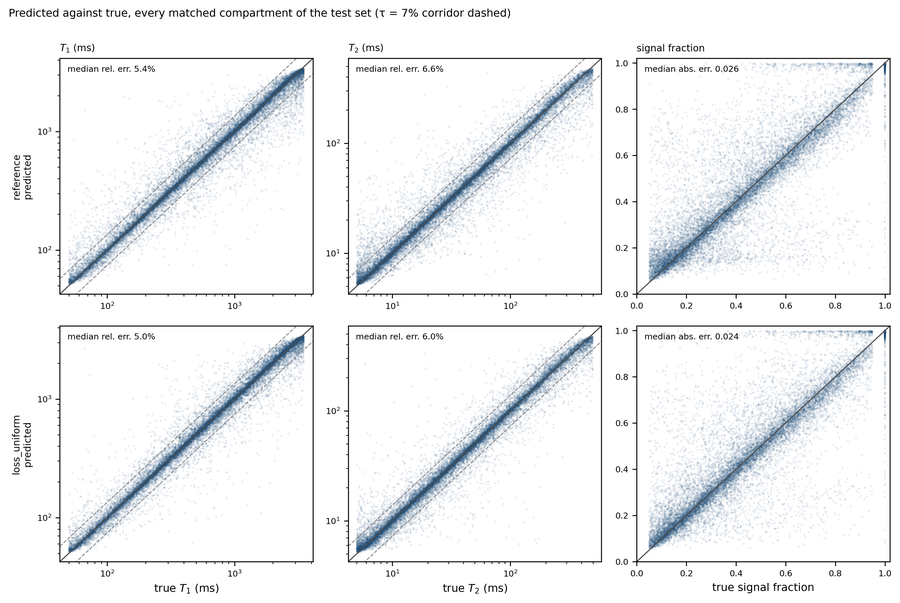

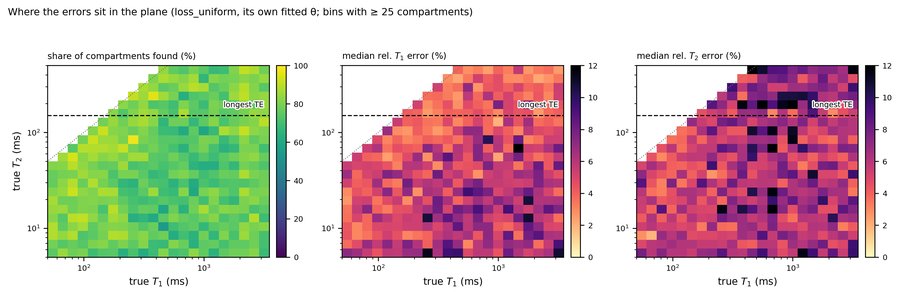

In [26]:
show("12_pred_true_scatter")
show("13_error_map")
show("fig_loss_uniform_tradeoff", optional=True)

## 3.6 Combining changes

Five models change more than one thing at once. Each carried success criteria in its
config before it was trained (the `notes` field of `configs/combined/*.yaml`). The
criteria are re-checked here from the stored metrics. v3 failed two of three and was
rejected; v4 kept what the decomposition had cleared and landed inside the seed spread;
the final combination did not beat the single change.

In [27]:
# deltas against the four-seed reference mean, the ruler configs/README.md uses
m_ref = mean_range([strict_cal(r) for r in REF_SEEDS])[0]
rows = []
for a in COMBINED:
    rows.append({"model": a, "what changed": CHANGE[a], "runs": 1, "theta": f"{theta_cal(a):.2f}",
                 "strict acc (%)": f"{strict_cal(a):.2f}",
                 "delta vs 4-seed reference (pp)": f"{strict_cal(a) - m_ref:+.2f}"})
m, rng = mean_range([strict_cal(r) for r in FQ6_SEEDS])
rows.append({"model": "final_uniform_q6", "what changed": CHANGE["final_uniform_q6"], "runs": 4,
             "theta": f"{np.mean([theta_cal(r) for r in FQ6_SEEDS]):.2f}",
             "strict acc (%)": f"{m:.2f} [{rng:.2f}]", "delta vs 4-seed reference (pp)": f"{m - m_ref:+.2f}"})
display(pd.DataFrame(rows).set_index("model"))

def crit(model, label, value, op, limit, dec):
    """Turn a measured value and its acceptance limit into a verdict."""
    ok = value >= limit if op == ">=" else value <= limit
    return {"model": model, "criterion": f"{label} {op} {limit}", "measured": f"{value:.{dec}f}",
            "verdict": "pass" if ok else "fail"}

v3, v4 = metrics("baseline_v3"), metrics("baseline_v4")
crit_rows = [
    crit("v3", "(a) count accuracy (%)", v3["count_accuracy"] * 100, ">=", 78.1, 2),
    crit("v3", "(b) faintest-band median rel. T1 error (%)", recovery_bins("baseline_v3")[0]["t1_relative_error_median"] * 100, "<=", 25, 2),
    crit("v3", "(c) pooled median abs. T1 error (ms)", v3["t1_abs_median_ms"], "<=", 27, 2),
    crit("v4", "(a) count accuracy (%)", v4["count_accuracy"] * 100, ">=", 78.1, 2),
    crit("v4", "(b) pooled median abs. T1 error (ms)", v4["t1_abs_median_ms"], "<=", 27, 2),
    crit("v4", "(c) existence F1", v4["existence_f1"], ">=", 0.944, 4),
]
display(pd.DataFrame(crit_rows).set_index("model"))

m_lu = mean_range([map7(r) for r in LU_SEEDS])[0]
m_fq = mean_range([map7(r) for r in FQ6_SEEDS])[0]
print(f"final_uniform_q6 against loss_uniform, four seeds each: strict {m:.2f} vs "
      f"{mean_range([strict_cal(r) for r in LU_SEEDS])[0]:.2f} %, mAP@7 {m_fq:.4f} vs {m_lu:.4f}")

,what changed,runs,theta,strict acc (%),delta vs 4-seed reference (pp)
model,,,,,
baseline_v3,"2 layers, 6 queries, shared head, sqrt(w) weig...",1,0.85,59.35,+1.72
baseline_v3_no_sqrt,v3 with signal-fraction weighting back,1,0.85,57.62,-0.02
baseline_v3_no_physics,v3 without the consistency term,1,0.85,58.44,+0.81
baseline_v4,"6 queries, shared head, consistency term",1,0.90,57.90,+0.27
final_uniform_q6,uniform weighting and 6 queries,4,0.69,60.76 [1.58],+3.13


,criterion,measured,verdict
model,,,
v3,(a) count accuracy (%) >= 78.1,77.49,fail
v3,(b) faintest-band median rel. T1 error (%) <= 25,29.62,fail
v3,(c) pooled median abs. T1 error (ms) <= 27,25.45,pass
v4,(a) count accuracy (%) >= 78.1,78.65,pass
v4,(b) pooled median abs. T1 error (ms) <= 27,27.41,fail
v4,(c) existence F1 >= 0.944,0.9446,pass


final_uniform_q6 against loss_uniform, four seeds each: strict 60.76 vs 61.43 %, mAP@7 0.7452 vs 0.7635


## 3.7 The physics term

Both arms with the signal-consistency term stay inside the seed spread on the headline
measures. The term sharpens the parameters of the compartments the signal already pins
down (pooled median absolute T1 error) and does nothing for the faint ones; the clean
target, the best case the term could have, does not help either.

In [28]:
rows = []
for a in (REF_ARM, "physics_noisy", "physics_clean"):
    mt = metrics(a)
    rows.append({"run": a, "theta": f"{theta_cal(a):.2f}", "strict acc (%)": f"{strict_cal(a):.2f}",
                 "mAP@7": f"{map7(a):.4f}", "median abs. T1 error (ms)": f"{mt['t1_abs_median_ms']:.2f}",
                 "median abs. T2 error (ms)": f"{mt['t2_abs_median_ms']:.2f}",
                 "faintest band found (%)": f"{recovery_bins(a)[0]['match_rate'] * 100:.2f}"})
display(pd.DataFrame(rows).set_index("run"))

,theta,strict acc (%),mAP@7,median abs. T1 error (ms),median abs. T2 error (ms),faintest band found (%)
run,,,,,,
baseline_v2_reproduction,0.90,57.98,0.6671,28.50,2.45,60.89
physics_noisy,0.95,58.05,0.6751,26.71,2.38,64.22
physics_clean,0.90,57.86,0.6672,26.94,2.32,63.62


## 3.8 Against the noise level

The five fixed-SNR test sets hold the same voxels with the same standardised noise
draw, so the noise amplitude is the only thing that changes between rungs. Means over
the four seeds of each model, range over seeds in brackets. SNR 20 lies below the
training range of 30 to 150.

,reference: strict acc (%),reference: count acc (%),reference: rel. T1 error (%),final model: strict acc (%),final model: count acc (%),final model: rel. T1 error (%)
SNR,,,,,,
20 (extrapolation),35.30 [2.82],62.45 [1.00],12.37 [0.45],37.62 [1.80],61.06 [1.40],12.41 [0.09]
40,49.08 [0.70],72.14 [0.52],7.62 [0.10],51.12 [1.12],69.15 [1.44],7.44 [0.21]
60,55.90 [0.42],75.82 [0.88],6.05 [0.18],58.78 [0.70],72.60 [1.32],5.72 [0.09]
100,61.07 [0.78],77.88 [1.04],4.95 [0.31],64.85 [1.42],74.42 [1.86],4.44 [0.08]
150,62.34 [0.98],78.02 [1.42],4.53 [0.27],67.10 [1.60],74.80 [1.32],3.96 [0.09]


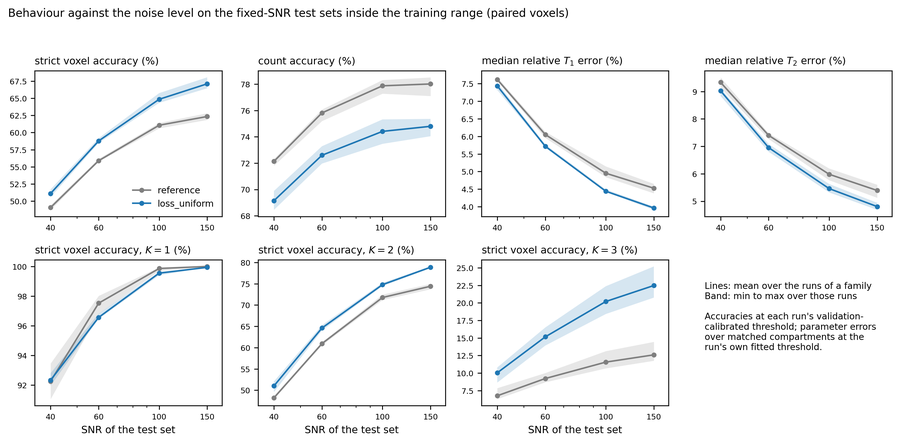

In [29]:
SNR = jload(RES / "snr_ladder" / "summary.json")
if SNR:
    names = list(SNR)                       # the reference family first, then the final model
    fams = {"reference": SNR[names[0]], "final model": SNR[names[1]]}
    rungs = sorted(next(iter(fams["reference"].values()))["rungs"], key=int)
    rows = []
    for rung in rungs:
        row = {"SNR": rung + (" (extrapolation)" if int(rung) < 30 else "")}
        for fam, runs in fams.items():
            for key, label, dec in (("strict_acc", "strict acc (%)", 2), ("count_acc", "count acc (%)", 2),
                                    ("t1_rel_median", "rel. T1 error (%)", 2)):
                m, rng = mean_range([runs[r]["rungs"][rung][key] for r in runs])
                row[f"{fam}: {label}"] = f"{m:.{dec}f} [{rng:.{dec}f}]"
        rows.append(row)
    display(pd.DataFrame(rows).set_index("SNR"))
    src = RES / "snr_ladder" / "snr_ladder.png"
    if src.exists() and not (FIG / "18_snr_ladder.png").exists():
        import shutil; shutil.copy(src, FIG / "18_snr_ladder.png")
show("18_snr_ladder")

## 3.9 Where the errors sit

Which query slots do any work (11); every true compartment of the test set, found or
missed, for both models (14, 15); detection and error against the true T2 alone, with
the longest echo time marked (16); what the missed compartments look like (17); the whole
error distribution rather than one median (19); and what the noise does to the small
compartments (20). The threshold sweep (last) shows why the existence threshold is
calibrated on validation rather than searched on test.

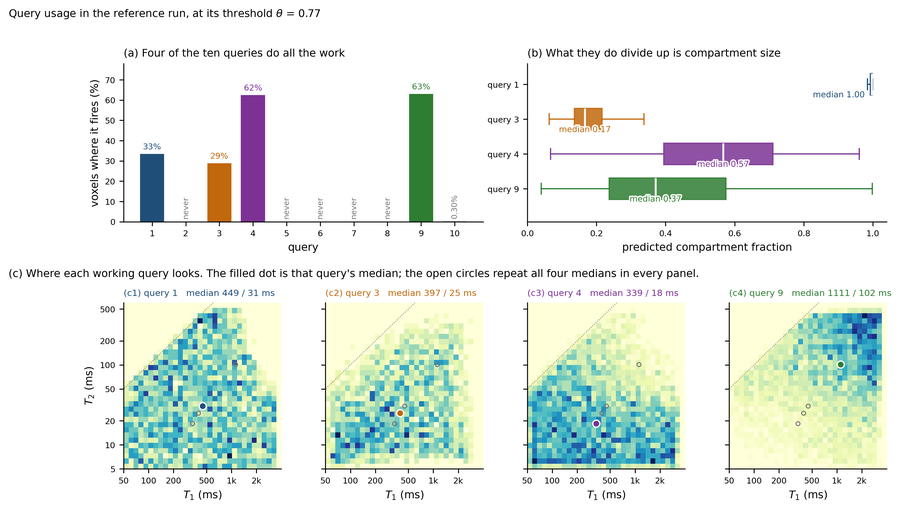

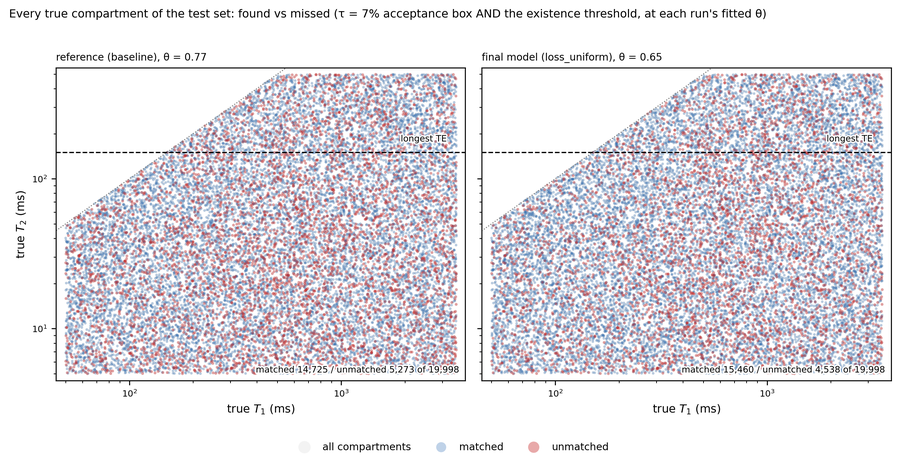

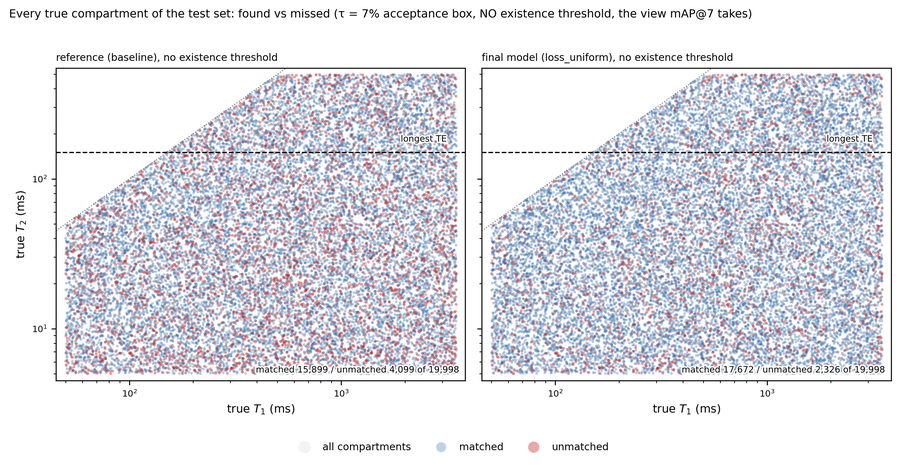

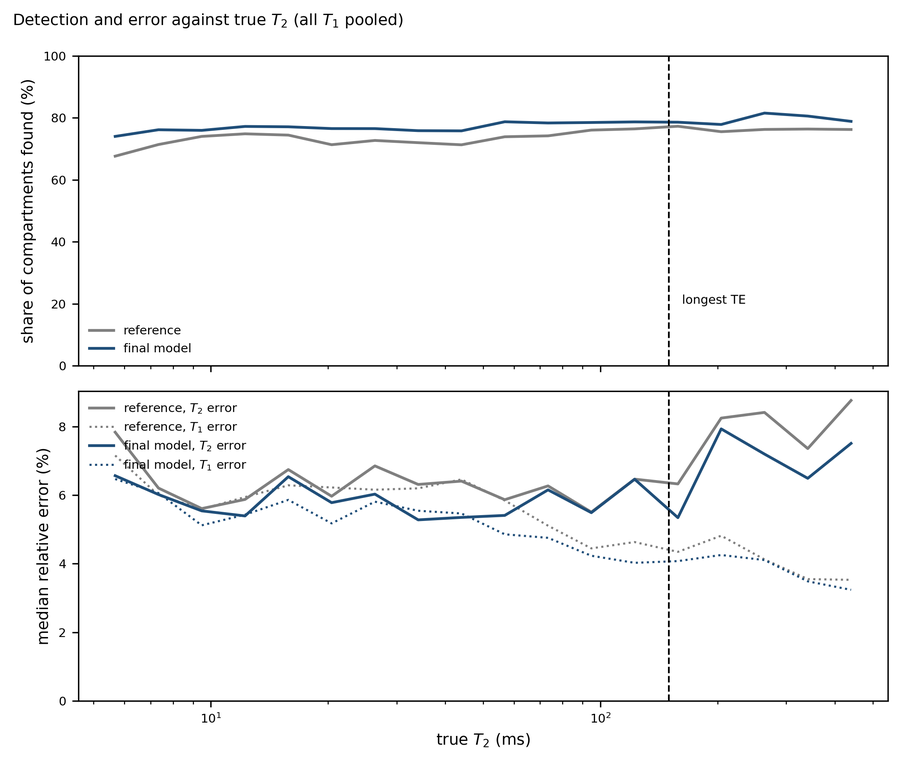

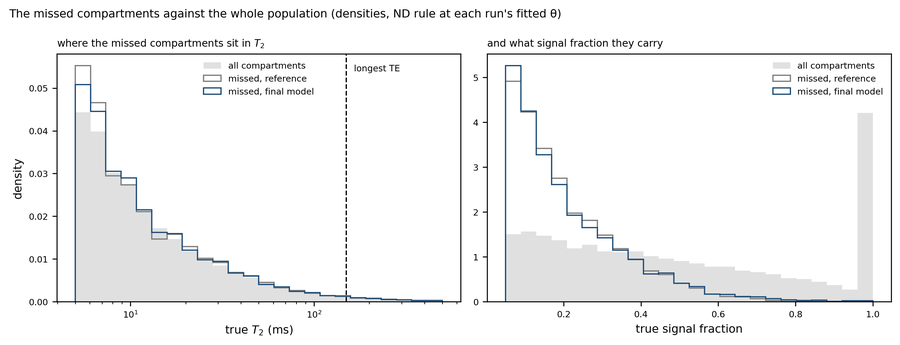

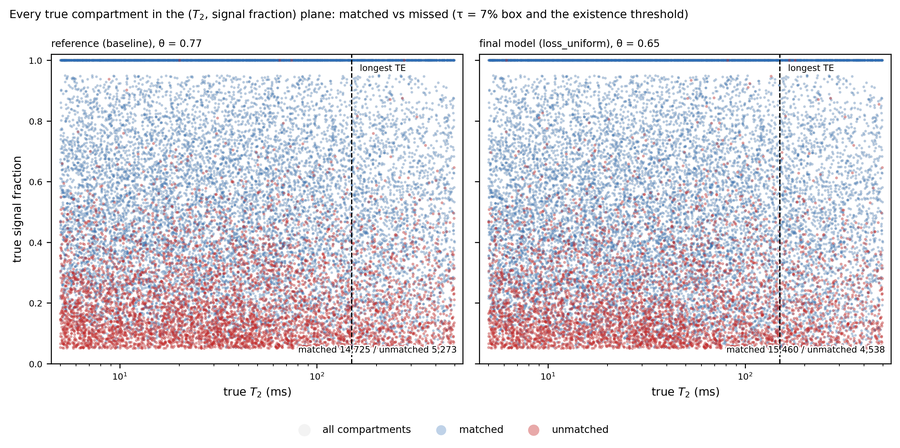

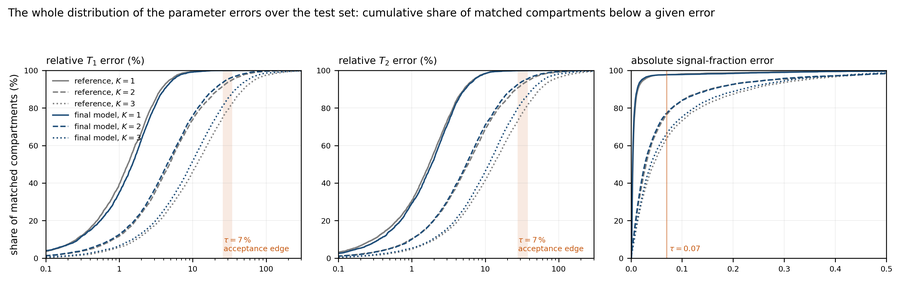

median    p90    p95 K=1 median K=2 median  \
model       error                                                        
reference   t1 relative (%)   5.40  34.80  52.43       1.31       4.81   
            t2 relative (%)   6.56  39.66  59.45       1.72       5.83   
final model t1 relative (%)   4.96  27.49  41.74       1.51       4.48   
            t2 relative (%)   6.02  31.41  47.62       1.86       5.52   

                            K=3 median within tau band (%)  
model       error                                           
reference   t1 relative (%)      11.38                85.2  
            t2 relative (%)      13.05                84.0  
final model t1 relative (%)       9.49                88.9  
            t2 relative (%)      11.20                87.9

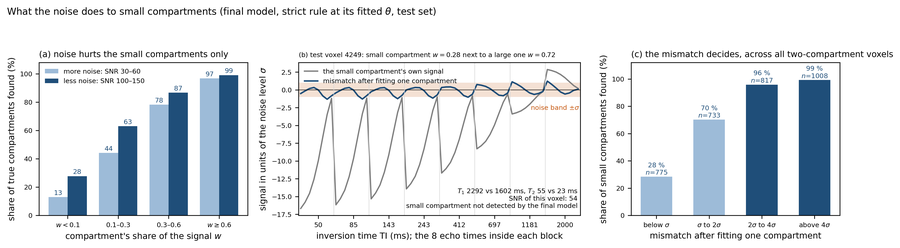

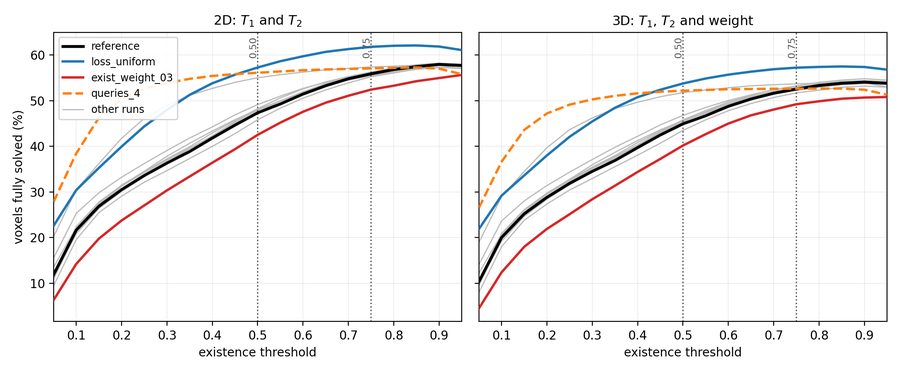

In [30]:
show("11_queries")
show("14_found_missed")
show("15_found_missed_map7")
show("16_t2_profile")
show("17_missed_dist")
show("17_missed_scatter")
show("19_error_distribution")
ED = jload(RES / "error_distribution_summary.json")
if ED:
    rows = []
    for model, d in ED.items():
        for q in ("t1_rel", "t2_rel"):
            rows.append({"model": model, "error": q.replace("_rel", " relative (%)"),
                         "median": f"{d[q]['median']:.2f}", "p90": f"{d[q]['p90']:.2f}",
                         "p95": f"{d[q]['p95']:.2f}",
                         "K=1 median": f"{d[q + '_K1']['median']:.2f}", "K=2 median": f"{d[q + '_K2']['median']:.2f}",
                         "K=3 median": f"{d[q + '_K3']['median']:.2f}",
                         "within tau band (%)": f"{d[q + '_share_le_band'] * 100:.1f}"})
    display(pd.DataFrame(rows).set_index(["model", "error"]))
show("20_noise_small_compartments")
show("fig_threshold_sweep")

## 3.10 The per-arm galleries

The same three voxels, one per compartment count, under every arm and the reference,
with shared axes so the panels are comparable across arms (the thesis appendix). These
are the figures Part 2 wrote to `figures/arms/`.

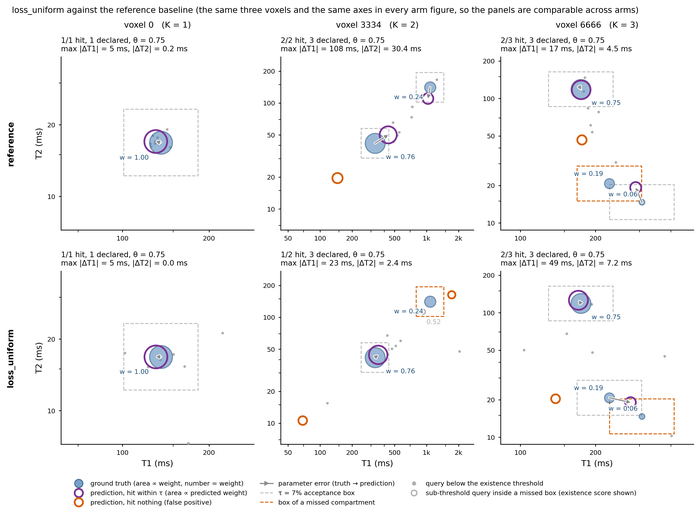

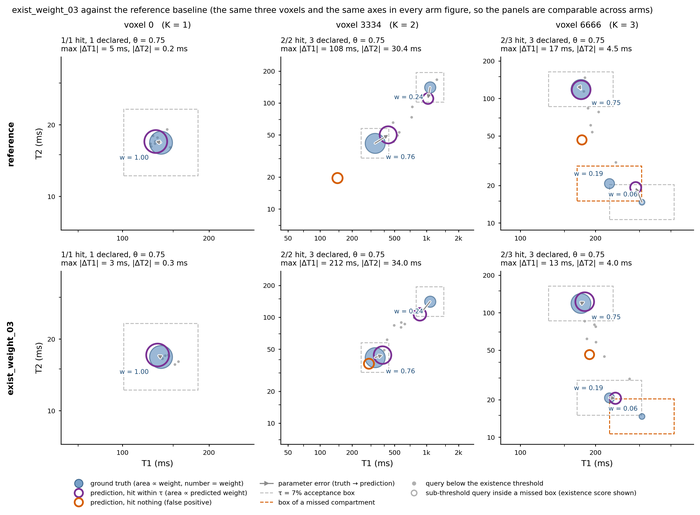

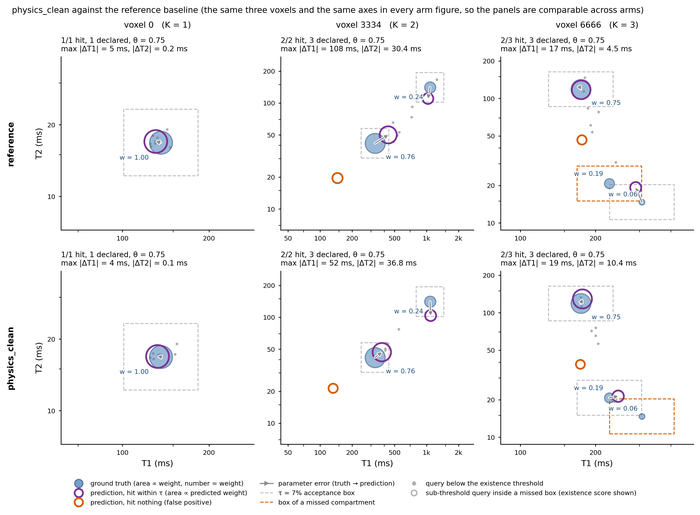

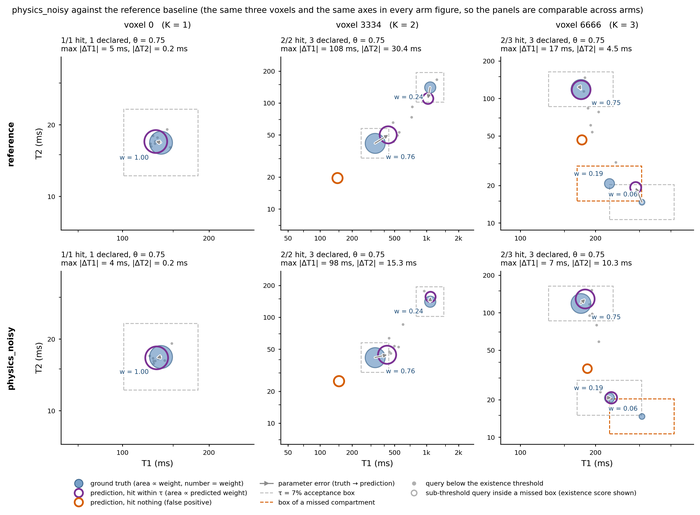

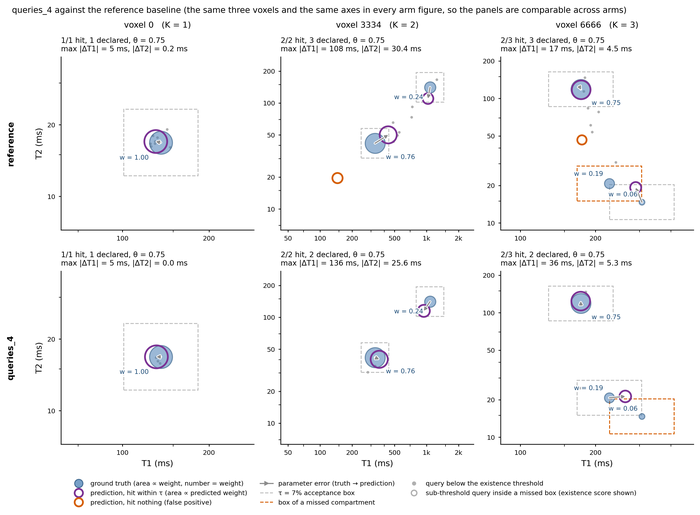

...

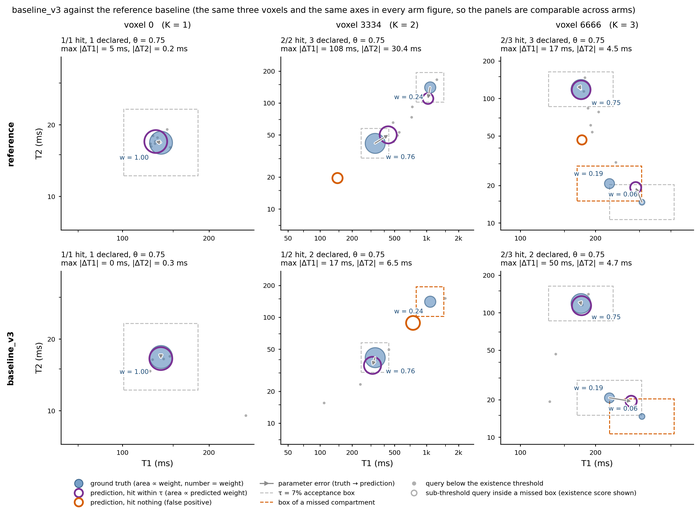

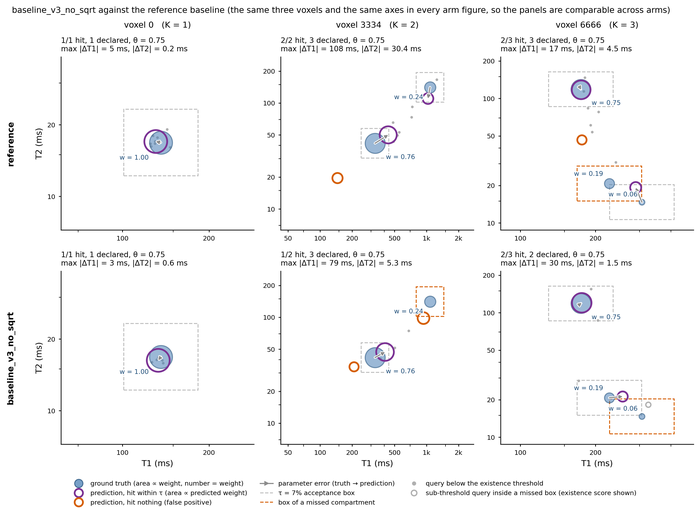

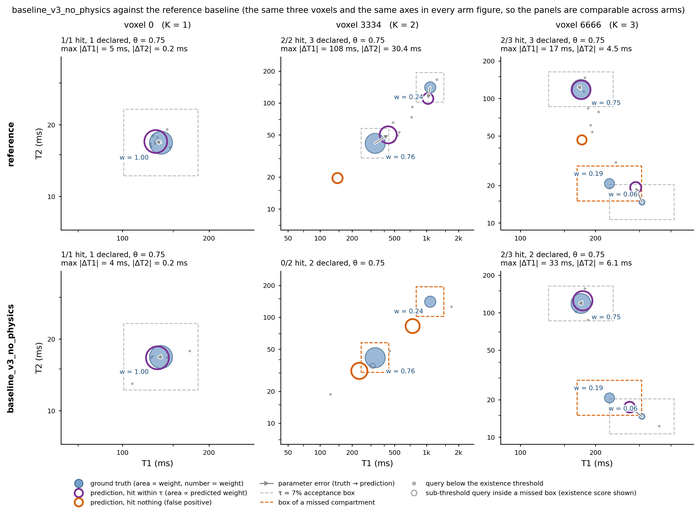

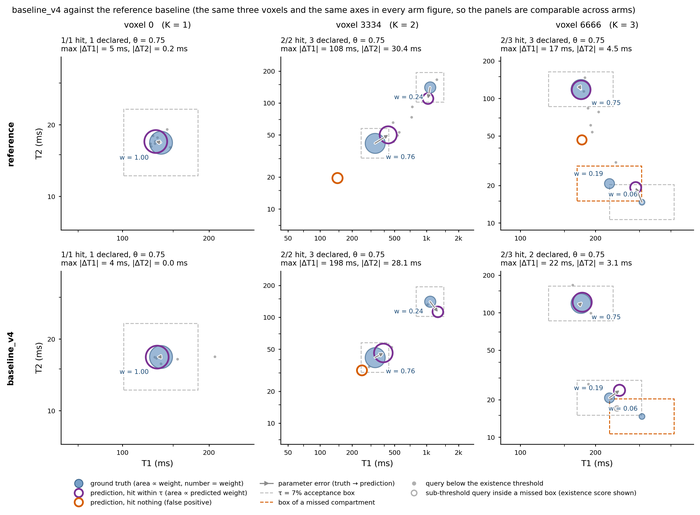

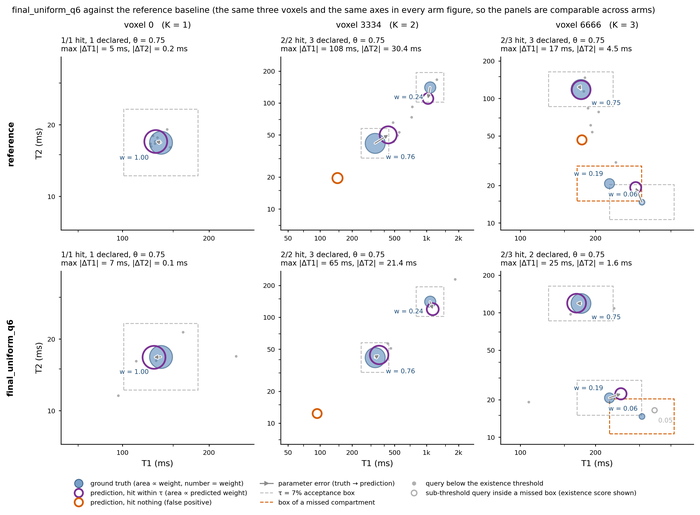

In [31]:
for a in GALLERY_ARMS:
    show(FIG / "arms" / f"{LABEL[a]}_examples.png", width=700)

## 3.11 Regenerating the figures

The scripts under `evaluation/figures/` rebuild every figure of the thesis from `results/`.
Most of them need the checkpoints, so this cell runs them only when the checkpoints are
present.

In [32]:
RUN_SCRIPTS = HAVE_CKPT
# In dependency order: the noise-ratio table before the noise figure. review_stats.json and
# tables_2d_3d.json are frozen outputs (results/README.md) and are not regenerated.
COMMANDS = [
    ["evaluation/snr_ladder.py"],
    ["evaluation/figures/make_relaxation_figure.py"],
    ["evaluation/figures/make_query_figure.py"],
    ["evaluation/figures/make_scatter_figure.py"],
    ["evaluation/figures/make_error_map.py"],
    ["evaluation/figures/make_found_scatter.py"],
    ["evaluation/figures/make_found_scatter.py", "--map7"],
    ["evaluation/figures/make_t2_profile.py"],
    ["evaluation/figures/make_missed_dist.py"],
    ["evaluation/figures/make_missed_scatter.py"],
    ["evaluation/figures/make_error_distribution.py"],
    ["evaluation/figures/make_noise_ratio_table.py"],
    ["evaluation/figures/make_noise_effect_figure.py"],
    ["evaluation/figures/plot_threshold_sweep.py"],
]
env = dict(os.environ, PYTHONPATH=".:datagen")
for cmd in COMMANDS:
    script = Path(cmd[0])
    if not script.exists():
        print(f"missing {' '.join(cmd)}")
        continue
    if not RUN_SCRIPTS:
        print(f"listed  {' '.join(cmd)}")
        continue
    r = subprocess.run([sys.executable, *cmd], capture_output=True, text=True, env=env)
    tail = (r.stdout.strip().splitlines() or [""])[-1]
    print(f"{'ok     ' if r.returncode == 0 else 'FAILED '}{' '.join(cmd)}: {tail[:100]}")
    if r.returncode != 0:
        print("   ", r.stderr.strip().splitlines()[-2:])
print("\nfigures/:", sorted(p.name for p in FIG.glob("*.png")))

ok     evaluation/snr_ladder.py: wrote results/snr_ladder/snr_ladder.tex


ok     evaluation/figures/make_relaxation_figure.py: wrote figures/00_relaxation.png


ok     evaluation/figures/make_query_figure.py: wrote figures/11_queries.png


ok     evaluation/figures/make_scatter_figure.py: wrote figures/12_pred_true_scatter.png


ok     evaluation/figures/make_error_map.py: wrote figures/13_error_map.png


ok     evaluation/figures/make_found_scatter.py: wrote figures/14_found_missed.png


ok     evaluation/figures/make_found_scatter.py --map7: wrote figures/15_found_missed_map7.png


ok     evaluation/figures/make_t2_profile.py: wrote figures/16_t2_profile.png


ok     evaluation/figures/make_missed_dist.py: wrote figures/17_missed_dist.png


ok     evaluation/figures/make_missed_scatter.py: wrote figures/17_missed_scatter.png


ok     evaluation/figures/make_error_distribution.py: wrote figures/19_error_distribution.png


ok     evaluation/figures/make_noise_ratio_table.py: wrote results/compartment_noise_ratio_test.parquet: 19998 compartments, found 0.736 (reference) / 0.


ok     evaluation/figures/make_noise_effect_figure.py: wrote figures/20_noise_small_compartments.png


ok     evaluation/figures/plot_threshold_sweep.py: wrote figures/fig_threshold_sweep.png

figures/: ['00_relaxation.png', '01_protocol.png', '02_coverage.png', '03_weights_snr.png', '04_signals.png', '05_paired_examples.png', '06_arm_wins.png', '07_reference_wins.png', '08_outcome_types.png', '09_gallery_reference.png', '10_gallery_arm.png', '11_queries.png', '12_pred_true_scatter.png', '13_error_map.png', '14_found_missed.png', '15_found_missed_map7.png', '16_t2_profile.png', '17_missed_dist.png', '17_missed_scatter.png', '18_snr_ladder.png', '19_error_distribution.png', '20_noise_small_compartments.png', '21_arm_deltas.png', 'fig_threshold_sweep.png']


## What this notebook does not show

Every number here comes from simulated voxels. The compartments are random points in
the (T1, T2) plane rather than tissue prototypes, and no real scan was evaluated, so
none of the accuracies above is an in-vivo result. The upper part of the T2 range is
weakly constrained by the protocol's longest echo time of 150 ms, and every arm except
the three retrained at four seeds rests on a single training run. The thesis discusses
both points.